In [3]:
##############
### Import ###
##############

import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
matplotlib.rcParams.update({'font.size': 25})

from scipy.optimize import curve_fit

In [21]:
import numpy as np
import astropy
from astropy.io import fits
from astropy.table import Table
from scipy.interpolate import InterpolatedUnivariateSpline
import warnings
# from scipy.optimize import curve_fit
from tqdm import tqdm_notebook

class AetasStellae():
    '''
    Class to calculate a star's age and extinction using PARSEC isochrones and extinction law
    from Cardelli et al. 1989
    '''
    def __init__(self,Logg,FeH,CNAlpha,Distance,Rv,Isochrones):
        
        '''
        Logg: [float] Log(g) of a star
        FeH: [float] metallicity [Fe/H] of star
        CNAlpha: [array] [C/Fe],[N/Fe],[O/Fe],[Mg/Fe],[Si/Fe],[S/Fe],[Ca/Fe],[Ti/Fe]
        Distance: [float] distance to star in pc
        Isochrones: [astropy Table] PARSEC isochrone table
        '''
        
        # Log(g)
        self.logg = Logg
        
        # Salaris Correction
        self.salfeh = self.SalarisCorrectedFeH(FeH,CNAlpha)
        
        # Distance modulus
        self.distmod = 5.0*np.log10(Distance)-5.0
        
        # PARSEC isochrones
        self.rv = Rv
        self.labels = ['G_BPmag','G_RPmag','Jmag','Hmag','Ksmag']
        
        self.uniq_ages = np.unique(Isochrones['logAge'])
        self.iso = Isochrones[np.where(Isochrones['MH']==self.closest(Isochrones['MH'],self.salfeh))]
        
        age_idx = []
        for i in range(len(self.uniq_ages)):
            ages, = np.where(self.iso['logAge']==self.uniq_ages[i])
            age_idx.append(np.array([min(ages),max(ages)]))
        
        self.age_idx = np.asarray(age_idx)
                
        # Effective Wavelengths of different passbands in units of microns
        self.leff = {'G_BPmag':0.5387,'Gmag':0.6419,'G_RPmag':0.7667,'Jmag':1.2345,'Hmag':1.6393,'Ksmag':2.1757}
        
    def SalarisCorrectedFeH(self,feh,cnalpha):
        '''
        Calculate the Salaris corrected [Fe/H] according to Salaris et al. 1993 with Piersanti et al. 2007 and 
        Asplund et al. 2009. Also C and N have been added to the alpha elements and Ne has been excluded.
        
        Inputs:
        ------
            feh: metallcity of a star
            cnalpa: array of abundances np.array([C/Fe],[N/Fe],[O/Fe],[Mg/Fe],[Si/Fe],[S/Fe],[Ca/Fe],[Ti/Fe])
        
        Output:
        ------
            
        '''
        # hydrogen_wgt = 1.008 #IUPAC
        # atomic_wgts = np.array([12.011,14.007,15.999,24.305,28.085,32.06,40.078,47.867]) #IUPAC
        # asplund = np.array([8.43,7.83,8.69,7.60,7.51,7.12,6.34,4.95]) #Asplund et al. 2009
        # ZX_sol = 0.0181 # (Z/X) Asplund et al. 2009
        # a = sum(10**(asplund-12.00)*(atomic_wgts/hydrowh_wgt)*(1/0.0181)) # a = 0.78963627131196057
        # b = 1-a # b = 0.21036372868803943
        
        asplund = np.array([8.43,7.83,8.69,7.60,7.51,7.12,6.34,4.95])
        
        # assign solar value to stars if abundance is bad
        for j in range(len(cnalpha)):
            if cnalpha[j] < -100. or cnalpha[j] > 10. or np.isfinite(cnalpha[j])==False:
                cnalpha[j] = 0.0
                
        if np.isfinite(0.0)==False:
            feh = 0.0
        
        fac_acn = sum(10**(asplund+cnalpha))/sum(10**asplund)
        salfeh = feh+np.log10(0.78963627131196057*fac_acn+0.21036372868803943)
        
        return salfeh 
    
        
    def closest(self,data,value):
        '''
        Find nearest value in array to given value
        
        Inputs:
        ------
            data: data to search through 
            value: value of interest
        '''
        
        data = np.asarray(data)
    
        return data[(np.abs(np.subtract(data,value))).argmin()]
    
    def neighbors(self,data,value):
        '''
        Find values of two elements closest to the given value
    
        Inputs:
        ------
            data: data to search through 
            value: value of interest
        
        Output:
        ------
            close1: closest value under the given value
            close2: closest value over the given value
        '''
    
        data = np.asarray(data)
        close1 = data[(np.abs(np.subtract(data,value))).argmin()]
        data = data[np.where(data!=close1)]
        close2 = data[(np.abs(np.subtract(data,value))).argmin()]
    
        return close1,close2
    
    def cardelli_a(self,x):
        '''
        a(x) function from Cardelli et al. 1989
    
        Input:
        -----
            x: effective wavelength in units of 1/micron
        
        Output:
        ------
            a: a function value  
        '''
        if 0.3 <= x < 1.1:
            a = 0.574*(x**1.61)
            return a
    
        elif 1.1 <= x < 3.3:
            y = x - 1.82
            a = (1.+0.17699*y-0.50477*(y**2)-0.02427*(y**3)+0.72085*(y**4)+
                 0.01979*(y**5)-0.77530*(y**6)+0.32999*(y**7))
            return a
    
        elif 3.3 <= x < 8.0:
            if x < 5.9:
                a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)
                return a
        
            else:
                fa = -0.04473*((x-5.9)**2)+0.1207*((x-5.9)**3)
                a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)+fa
                return a       
    
    def cardelli_b(self,x):
        '''
        b(x) function from Cardelli et al. 1989
    
        Input:
        -----
            x: effective wavelength in units of 1/micron
        
        Output:
        ------
            b: b function value 
        '''
        if 0.3 <= x < 1.1:
            b = -0.527*(x**1.61)
            return b
    
        elif 1.1 <= x <= 3.3:
            y = x - 1.82
            b = (1.41338*y+2.28305*(y**2)+1.07233*(y**3)-5.38434*(y**4)-
                 0.62251*(y**5)+5.30260*(y**6)-2.09002*(y**7))
            return b
    
        elif 3.3 <= x < 8.0:
            if x < 5.9:
                b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)
                return b
        
            else:
                fb = 0.2130*((x-5.9)**2)+0.1207*((x-5.9)**3)
                b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)+fb
                return b
    
    def cardelli_alav(self,wave):
        '''
        Calculate A\lambda/Av
    
        Inputs:
        ------
            wave: effective wavelength in units of micron
            rv: Rv value (=Av/E(B_V))
        
        Output:
        ------
            alav: A\lambda/Av
        '''
        x=1/wave
        alav = self.cardelli_a(x)+self.cardelli_b(x)/self.rv
        return alav    
        
    def Teff2AppMags(self,teff,age,ak):
        '''
        Calculate the expected apparent magnitude of a star
        
        Inputs:
        ------
            teff: temperature of star
            age: age of star
            ak: extinction in the 2MASS K band
        
        Output:
        ------
            calc_mag: expected intrinsic magnitude for the given temperature
        '''
        
        #Some calcualtions to set things up
        lgteff = np.log10(teff)
        
        twg = self.logg-4*np.log10(teff/10000)
        
        abpak = self.cardelli_alav(self.leff['G_BPmag'])/self.cardelli_alav(self.leff['Ksmag'])
        arpak = self.cardelli_alav(self.leff['G_RPmag'])/self.cardelli_alav(self.leff['Ksmag'])
        ajak = self.cardelli_alav(self.leff['Jmag'])/self.cardelli_alav(self.leff['Ksmag'])
        ahak = self.cardelli_alav(self.leff['Hmag'])/self.cardelli_alav(self.leff['Ksmag'])
        
        extincts = np.array([abpak,arpak,ajak,ahak,1.0])*ak
        
        lgage = np.log10(age*10**9)
        
        ##print('Input [Age, Ak]: ',[age,ak])
        
        # Figure out if age is actually in the ages given in the isochrone table
        if lgage in self.uniq_ages:
            
            ### pick out a single isochrone 
            aidx, = np.where(self.uniq_ages==lgage)
            iso_ = self.iso[self.age_idx[int(aidx)][0]:self.age_idx[int(aidx)][1]]
            
            if lgteff < min(iso_['logTe']) or lgteff > max(iso_['logTe']):
                #print('[BP,RP,J,H,K]: ',np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0]))
                #warnings.warn("Temperature outside range of selected isochrone")
                return np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0])
            
            ### sort so temp is always increasing
            sidx = np.argsort((iso_['logg']-4.*np.log10(10**iso_['logTe']/10000)))
            stwg_iso = (iso_['logg']-4.*np.log10(10**iso_['logTe']/10000))[sidx]
            _, uidx = np.unique(stwg_iso,return_index=True)
            stwg_iso = stwg_iso[uidx]
            
            ### use a spline to get the apparent mags
            calc_mags = 999999.0*np.ones(5)
            for i in range(5):
                mag_spl = InterpolatedUnivariateSpline(stwg_iso,iso_[self.labels[i]][sidx][uidx])
                calc_mags[i] = mag_spl(twg)+self.distmod+extincts[i]
            
            #print('[J,H,K]: ',calc_mags)
            return calc_mags
            
        else:
            lgage_lo,lgage_hi = self.neighbors(self.uniq_ages,lgage)
#             #print('[lgage_lo,lgage_hi]: ',[lgage_lo,lgage_hi])
            #print('[age_lo,age_hi]: ',[10**lgage_lo/10**9,10**lgage_hi/10**9])
            
            ### Pick out single isochrones
        
            # younger
            aidx_lo, = np.where(self.uniq_ages==lgage_lo)
            iso_lo = self.iso[self.age_idx[int(aidx_lo)][0]:self.age_idx[int(aidx_lo)][1]]
            
            # older
            aidx_hi, = np.where(self.uniq_ages==lgage_hi)
            iso_hi = self.iso[self.age_idx[int(aidx_hi)][0]:self.age_idx[int(aidx_hi)][1]]
            
            ### Temperature Check
            if lgteff < min(iso_lo['logTe']) or lgteff > max(iso_lo['logTe']):
                #print('[BP,RP,J,H,K]: ',np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0]))
                #warnings.warn("Temperature outside range of selected isochrone")
                return np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0])
            if lgteff < min(iso_hi['logTe']) or lgteff > max(iso_hi['logTe']):
                #print('[BP,RP,J,H,K]: ',np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0]))
                #warnings.warn("Temperature outside range of selected isochrone")
                return np.array([999999.0, 999999.0, 999999.0, 999999.0, 999999.0])
            
            ### sort so temp is always increasing
            
            # younger
            sidx_lo = np.argsort((iso_lo['logg']-4.*np.log10(10**iso_lo['logTe']/10000)))
            stwg_iso_lo = (iso_lo['logg']-4.*np.log10(10**iso_lo['logTe']/10000))[sidx_lo]
            _, uidx_lo = np.unique(stwg_iso_lo,return_index=True)
            stwg_iso_lo = stwg_iso_lo[uidx_lo]
            
            # older
            sidx_hi = np.argsort((iso_hi['logg']-4.*np.log10(10**iso_hi['logTe']/10000)))
            stwg_iso_hi = (iso_hi['logg']-4.*np.log10(10**iso_hi['logTe']/10000))[sidx_hi]
            _, uidx_hi = np.unique(stwg_iso_hi,return_index=True)
            stwg_iso_hi = stwg_iso_hi[uidx_hi]
            
            ### use a spline to get the apparent mags
            age_lo = 10**lgage_lo/10**9
            age_hi = 10**lgage_hi/10**9
            calc_mags = 999999.0*np.ones(5)
            for i in range(5):
                mag_spl_lo = InterpolatedUnivariateSpline(stwg_iso_lo,iso_lo[self.labels[i]][sidx_lo][uidx_lo])
                mag_spl_hi = InterpolatedUnivariateSpline(stwg_iso_hi,iso_hi[self.labels[i]][sidx_hi][uidx_hi])
                age_spl_interp = np.poly1d(np.squeeze(np.polyfit([age_lo,age_hi],
                                                                 [mag_spl_lo(twg),mag_spl_hi(twg)],1)))
                calc_mags[i] = age_spl_interp(age)+self.distmod+extincts[i]
            #print('[BP,RP,J,H,K]: ',calc_mags)
            return calc_mags

In [2]:
leff = {'BP':0.5387,'G':0.6419,'RP':0.7667,'J':1.2345,'H':1.6393,'K':2.1757}
def cardelli_a(x):
    '''
    a(x) function from Cardelli et al. 1989
    
    Input:
    -----
        x: effective wavelength in units of 1/micron
        
    Output:
    ------
        a: a function value  
    '''
    if 0.3 <= x < 1.1:
        a = 0.574*(x**1.61)
        return a
    
    elif 1.1 <= x < 3.3:
        y = x - 1.82
        a = (1.+0.17699*y-0.50477*(y**2)-0.02427*(y**3)+0.72085*(y**4)+
                0.01979*(y**5)-0.77530*(y**6)+0.32999*(y**7))
        return a
    
    elif 3.3 <= x < 8.0:
        if x < 5.9:
            a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)
            return a
        
        else:
            fa = -0.04473*((x-5.9)**2)+0.1207*((x-5.9)**3)
            a = 1.752-0.136*x-0.104/((x-4.67)**2+0.341)+fa
            return a       
    
def cardelli_b(x):
    '''
    b(x) function from Cardelli et al. 1989
    
    Input:
    -----
        x: effective wavelength in units of 1/micron
        
    Output:
    ------
        b: b function value 
    '''
    if 0.3 <= x < 1.1:
        b = -0.527*(x**1.61)
        return b
    
    elif 1.1 <= x <= 3.3:
        y = x - 1.82
        b = (1.41338*y+2.28305*(y**2)+1.07233*(y**3)-5.38434*(y**4)-
                0.62251*(y**5)+5.30260*(y**6)-2.09002*(y**7))
        return b
    
    elif 3.3 <= x < 8.0:
        if x < 5.9:
            b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)
            return b
        
        else:
            fb = 0.2130*((x-5.9)**2)+0.1207*((x-5.9)**3)
            b = -3.090+1.825*x+1.206/((x-4.62)**2+0.263)+fb
            return b
    
def cardelli_alav(wave,rv):
    '''
    Calculate A\lambda/Av
    
    Inputs:
    ------
        wave: effective wavelength in units of micron
        rv: Rv value (=Av/E(B_V))
        
    Output:
    ------
        alav: A\lambda/Av
    '''
    x=1/wave
    alav = cardelli_a(x)+cardelli_b(x)/rv
    return alav

ejk_ak = (cardelli_alav(leff['J'],3.1)-cardelli_alav(leff['K'],3.1))/cardelli_alav(leff['K'],3.1)

def closest(data,value):
    '''
    Find nearest value in array to given value
        
    Inputs:
    ------
        data: data to search through 
        value: value of interest
    '''
        
    data = np.asarray(data)
    return data[(np.abs(np.subtract(data,value))).argmin()]

# PARSEC Isochrones

In [4]:
### massive
massive = fits.getdata('/Users/joshuapovick/Desktop/Research/parsec/parsec_massive.fits.gz',0)
massive = Table(massive[np.where(massive['label']==3.0)])
massive['index'] = np.arange(len(massive))
massive = massive[np.argsort(massive['logAge'])]
massive = massive['index','MH','logAge','logTe','logg','Gmag','G_BPmag','G_RPmag','Jmag','Hmag','Ksmag']

# Globular Clusters

In [6]:
### GCS Data
gcs = fits.getdata('/Users/joshuapovick/Desktop/Research/fits/allStar-r13-l33-58932beta_apa_dist_galvel_gc.fits.gz')
# cln = np.where((gcs['FE_H']>-9999.0)&(gcs['AK_TARG']>-9999.0)&(gcs['LOGG']>0.0)&
#                 (gcs['C_FE']>-9999.0)&(gcs['N_FE']>-9999.0))
# gcs = Table(gcs[cln])
gcs = Table(gcs[np.where((gcs['LOGG']>0.0)&(gcs['FE_H']>-9999.0)&(np.isfinite(gcs['FE_H'])==True))])

### Find Cluster with more than one star

idx = []
for i in range(len(np.unique(gcs['CLUSTER']))):
    idx.append(np.squeeze(np.where(gcs['CLUSTER']==np.unique(gcs['CLUSTER'])[i])))

for i in range(len(idx)):
    try:
        len(idx[i])
    except:
        print('bad: ',i)
        
good_names = []
for i in np.asarray(idx,dtype=object)[np.delete(np.asarray(list(range(len(idx)))),[28])]:
    if np.size(i)>10:
        good_names.append(gcs['CLUSTER'][i][0])

print(good_names)

# 
good_clus = np.where((gcs['CLUSTER']=='47Tuc')|(gcs['CLUSTER']=='M10')|(gcs['CLUSTER']=='M107')|
                     (gcs['CLUSTER']=='M12')|(gcs['CLUSTER']=='M13')|(gcs['CLUSTER']=='M15')|
                     (gcs['CLUSTER']=='M19')|(gcs['CLUSTER']=='M2')|(gcs['CLUSTER']=='M22')|
                     (gcs['CLUSTER']=='M3')|(gcs['CLUSTER']=='M4')|(gcs['CLUSTER']=='M5')|
                     (gcs['CLUSTER']=='M53')|(gcs['CLUSTER']=='M54')|(gcs['CLUSTER']=='M55')|
                     (gcs['CLUSTER']=='M68')|(gcs['CLUSTER']=='M71')|(gcs['CLUSTER']=='M79')|
                     (gcs['CLUSTER']=='M92')|(gcs['CLUSTER']=='NGC1851')|(gcs['CLUSTER']=='NGC2808')|
                     (gcs['CLUSTER']=='NGC288')|(gcs['CLUSTER']=='NGC3201')|(gcs['CLUSTER']=='NGC362')|
                     (gcs['CLUSTER']=='NGC5053')|(gcs['CLUSTER']=='NGC5466')|(gcs['CLUSTER']=='NGC6304')|
                     (gcs['CLUSTER']=='NGC6388')|(gcs['CLUSTER']=='NGC6752')|(gcs['CLUSTER']=='NGC6760'))

gcs = gcs[good_clus]

### DR17
dr17 = fits.getdata('/Users/joshuapovick/Desktop/Research/fits/allStarLite-dr17-synspec.fits.gz')
_, gcs_ind, dr17_ind = np.intersect1d(gcs['APOGEE_ID'], dr17['APOGEE_ID'], return_indices=True)

gcsdr17 = dr17[dr17_ind]
gcs = gcs[gcs_ind]

gcs_clus = np.unique(gcs['CLUSTER'])

bad:  28
['47Tuc', 'M10', 'M107', 'M12', 'M13', 'M15', 'M19', 'M2', 'M22', 'M3', 'M4', 'M5', 'M53', 'M54', 'M55', 'M68', 'M71', 'M79', 'M92', 'NGC1851', 'NGC2808', 'NGC288', 'NGC3201', 'NGC362', 'NGC5053', 'NGC5466', 'NGC6304', 'NGC6316', 'NGC6388', 'NGC6397', 'NGC6441', 'NGC6642', 'NGC6752', 'NGC6760', 'Terzan9', 'Ton1', 'omegaCen']


In [7]:
gaiaedr3 = fits.getdata('/Users/joshuapovick/Desktop/Research/gaia/GAIAEDR3allStar.fits.gz')

In [8]:
med_apo_feh = np.array([])
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i])&(gcsdr17['FE_H']>-100.))
    med_apo_feh = np.append(med_apo_feh,np.nanmedian(gcsdr17['FE_H'][clus]))
#     print('{}: {:.3f}'.format(gcs_clus[i],np.nanmedian(gcsdr17['FE_H'][clus])))
    
harris_dist = np.array([4.5,4.4,6.3,4.8,7.1,10.4,8.8,11.5,3.2,10.2,2.2,7.5,17.9,26.5,5.4,10.3,4.0,12.9,8.3,12.1,
                        9.6,8.9,4.9,8.6,17.4,16.0,5.9,9.9,4.0,7.4])*1000
harris_feh = np.array([-0.72,-1.56,-1.02,-1.37,-1.53,-2.37,-1.74,-1.65,-1.70,-1.50,-1.16,-1.29,-2.10,-1.49,-1.94,
                       -2.23,-0.78,-1.60,-2.31,-1.18,-1.14,-1.32,-1.59,-1.26,-2.27,-1.98,-0.45,-0.55,-1.54,-0.40])
vanden_feh = np.array([-0.76,-1.57,-1.03,-1.33,-1.58,-2.33,-1.53,-1.66,-1.70,-1.50,-1.18,-1.33,-2.06,-1.44,-1.93,
                       -2.27,-0.82,-1.60,-2.35,-1.18,-1.18,-1.32,-1.51,-1.30,-2.30,-2.31,-0.37,-0.77,-1.55,-0.60])
vanden_age = np.array([11.75,11.75,12.00,13.00,12.00,12.75,11.90,11.75,12.50,11.75,11.50,11.50,12.25,11.75,13.00,
                       12.00,11.00,11.0,12.75,11.00,11.00,11.50,11.50,11.75,12.25,12.50,11.25,12.03,12.50,11.26])

gcs_dist = 999999.0*np.ones(len(gcs))
for i in range(len(np.unique(gcs['CLUSTER']))):
    clus = np.where(gcs['CLUSTER']==np.unique(gcs['CLUSTER'])[i])
    gcs_dist[clus] = harris_dist[i]

print('Harris-APOGEE:',np.median(harris_feh-med_apo_feh))
print('VandenBerg-APOGEE:',np.median(vanden_feh-med_apo_feh))
print('Overall:',np.median([np.median(harris_feh-med_apo_feh),np.median(vanden_feh-med_apo_feh)]))

shiftfeh = 999999*np.ones(len(gcsdr17))
for i in range(len(gcsdr17)):
    if np.isfinite(gcsdr17['FE_H'][i])==False:
        shiftfeh[i] = 0.0+np.median([np.median(harris_feh-med_apo_feh),np.median(vanden_feh-med_apo_feh)])
    else:
        shiftfeh[i] = (gcsdr17['FE_H'][i]+
                       np.median([np.median(harris_feh-med_apo_feh),np.median(vanden_feh-med_apo_feh)]))

Harris-APOGEE: -0.07535000324249275
VandenBerg-APOGEE: -0.08275001049041741
Overall: -0.07905000686645508


(array([], dtype=int64),)

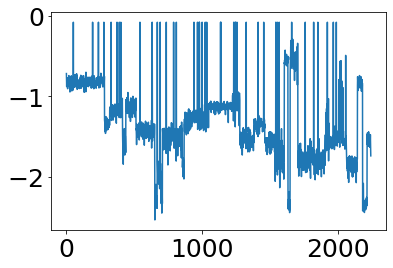

In [9]:
plt.plot(shiftfeh)
np.where(np.isfinite(shiftfeh)==False)

In [10]:
# mark rc and agb include in fitting
# run with new salaris -0.08
# maybe a few younger clusters
# with gaia included

In [11]:
def salaris(feh,cnalpha):
    '''
    Calculate the Salaris corrected [Fe/H] according to Salaris et al. 1993 with Piersanti et al. 2007 and 
    Asplund et al. 2009. Also C and N have been added to the alpha elements and Ne has been excluded.
        
    Inputs:
    ------
        feh: metallcity of a star
        cnalpa: array of abundances np.array([C/Fe],[N/Fe],[O/Fe],[Mg/Fe],[Si/Fe],[S/Fe],[Ca/Fe],[Ti/Fe])
        
    Output:
    ------
            
    '''
    asplund = np.array([8.43,7.83,8.69,7.60,7.51,7.12,6.34,4.95])
        
    # assign solar value to stars if abundance is bad
    for j in range(len(cnalpha)):
        if cnalpha[j] < -100. or cnalpha[j] > 10. or np.isfinite(cnalpha[j])==False:
            cnalpha[j] = 0.0
        
    if np.isfinite(feh)==False:
        feh = 0.0
    
    fac_acn = sum(10**(asplund+cnalpha))/sum(10**asplund)
    salfeh = feh+np.log10(0.78963627131196057*fac_acn+0.21036372868803943)
        
    return salfeh

In [12]:
all_sal_feh = np.array([])
for i in range(len(gcsdr17)):
    cnalpha = np.array([gcsdr17['C_FE'][i],gcsdr17['N_FE'][i],gcsdr17['O_FE'][i],gcsdr17['MG_FE'][i],
                        gcsdr17['SI_FE'][i],gcsdr17['S_FE'][i],gcsdr17['CA_FE'][i],gcsdr17['TI_FE'][i]])
    
    all_sal_feh = np.append(all_sal_feh,salaris(gcsdr17['FE_H'][i],cnalpha))

In [13]:
for i in range(len(gcs_clus)):
    clus = np.where(gcs['CLUSTER']==gcs_clus[i])
    print(np.median(all_sal_feh[clus]))

-0.4732497552643804
-1.2954019544254194
-0.6558759861592895
-1.0316745882607201
-1.2957456385036394
-1.9686354610223893
-1.4913496625701155
-1.3140107651772432
-1.4287206578866434
-1.276077012953488
-0.7360957357015213
-1.0121149244455172
-1.6562981486491537
-1.264514101466443
-1.547733215742363
-2.0251212383717436
-0.5151533808221831
-1.3354111518124823
-1.9392855178715387
-0.9338590707381655
-0.9231541800272747
-0.9765214854759225
-1.1960234379048276
-0.9599301048801605
-2.0140285520416987
-1.6999741036311402
-0.23133385703844814
-0.34223077801815555
-1.264614091440557
-0.4445708219300748


In [14]:
gcs0 = [np.where(gcs['CLUSTER']==gcs_clus[0])]
print(gcsdr17['FE_H'][gcs0])
print(gcsdr17['C_FE'][gcs0])
print(gcsdr17['N_FE'][gcs0])
print(gcsdr17['O_FE'][gcs0])
print(gcsdr17['MG_FE'][gcs0])
print(gcsdr17['SI_FE'][gcs0])
print(gcsdr17['S_FE'][gcs0])
print(gcsdr17['CA_FE'][gcs0])
print(gcsdr17['TI_FE'][gcs0])

[[-0.63845 -0.74213 -0.80151 -0.70368 -0.73453 -0.70733 -0.69091 -0.78465
  -0.75756 -0.82673 -0.73687 -0.74011 -0.79353 -0.78194 -0.79744 -0.73106
  -0.74734 -0.69776 -0.66345 -0.7129  -0.77431 -0.7649  -0.74911 -0.71098
  -0.79187 -0.77227 -0.86751 -0.8072  -0.81734 -0.78258 -0.72704 -0.68571
  -0.78342 -0.71897 -0.6993  -0.83024 -0.66657 -0.73698 -0.78339 -0.704
  -0.8547  -0.72663 -0.70781 -0.71867 -0.77889 -0.71482 -0.68314 -0.84639
  -0.80939 -0.80852 -0.73732      nan -0.74638 -0.74135 -0.75243 -0.77039
  -0.79155 -0.80454 -0.70199 -0.76099 -0.81053 -0.77235 -0.6557  -0.7317
  -0.79981 -0.74833 -0.65137 -0.74402 -0.65702 -0.7325  -0.69161 -0.69606
  -0.73663 -0.71381 -0.70706 -0.64007 -0.7788  -0.66119 -0.77845 -0.71984
  -0.83528 -0.72819 -0.71413 -0.81075 -0.75616 -0.74034 -0.76081 -0.72445
  -0.81594 -0.73536 -0.79408 -0.76036 -0.74197 -0.78941 -0.72293 -0.8072
  -0.82482 -0.70671 -0.72596 -0.70992 -0.75525 -0.694   -0.75824 -0.72631
  -0.67542 -0.70405 -0.65953 -0.79979 -0.8

<ipython-input-14-3a16c0193d8e>:2: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  print(gcsdr17['FE_H'][gcs0])
<ipython-input-14-3a16c0193d8e>:3: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  print(gcsdr17['C_FE'][gcs0])
<ipython-input-14-3a16c0193d8e>:4: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  print(gcsdr17['

In [15]:
for i in np.squeeze(gcs0):
    cnalpha = np.array([gcsdr17['C_FE'][i],gcsdr17['N_FE'][i],gcsdr17['O_FE'][i],gcsdr17['MG_FE'][i],
                        gcsdr17['SI_FE'][i],gcsdr17['S_FE'][i],gcsdr17['CA_FE'][i],gcsdr17['TI_FE'][i]])
    
    print(salaris(gcsdr17['FE_H'][i],cnalpha))

-0.5082237640826803
-0.5289460478491667
-0.5417734212711552
-0.4602098713244658
-0.4801281006720574
-0.4639233480094741
-0.40642971020053503
-0.5347989654197396
-0.4938561286343812
-0.4602431063857749
-0.4277085541891559
-0.45267249221300715
-0.5193555838574662
-0.5300266761383599
-0.5400646015513457
-0.4754176654513616
-0.4891794613031733
-0.43756224668199
-0.4155724626410763
-0.43751260401332376
-0.541124471849197
-0.549964531442859
-0.5255939918067154
-0.429638122815832
-0.5680336391324896
-0.5245954101889885
-0.6465703970722612
-0.5127521273499795
-0.6089851260664982
-0.5639308077270939
-0.5066056555623087
-0.42369053591148753
-0.5482411221964356
-0.4573290512108559
-0.4752504203532179
-0.5548657131297114
-0.3811209401734289
-0.5147716175897495
-0.5378686110554477
-0.4639135923120976
-0.4749159718135958
-0.4011745224692287
-0.4062226658902774
-0.46784451533882904
-0.527029547446335
-0.47860634503131316
-0.30914974626523894
-0.6102095015274012
-0.7801629720234893
-0.5964569737242804

In [16]:
gcsdr17['FE_H'][gcs0]

<ipython-input-16-69883fbf980b>:1: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  gcsdr17['FE_H'][gcs0]


array([[-0.63845, -0.74213, -0.80151, -0.70368, -0.73453, -0.70733,
        -0.69091, -0.78465, -0.75756, -0.82673, -0.73687, -0.74011,
        -0.79353, -0.78194, -0.79744, -0.73106, -0.74734, -0.69776,
        -0.66345, -0.7129 , -0.77431, -0.7649 , -0.74911, -0.71098,
        -0.79187, -0.77227, -0.86751, -0.8072 , -0.81734, -0.78258,
        -0.72704, -0.68571, -0.78342, -0.71897, -0.6993 , -0.83024,
        -0.66657, -0.73698, -0.78339, -0.704  , -0.8547 , -0.72663,
        -0.70781, -0.71867, -0.77889, -0.71482, -0.68314, -0.84639,
        -0.80939, -0.80852, -0.73732,      nan, -0.74638, -0.74135,
        -0.75243, -0.77039, -0.79155, -0.80454, -0.70199, -0.76099,
        -0.81053, -0.77235, -0.6557 , -0.7317 , -0.79981, -0.74833,
        -0.65137, -0.74402, -0.65702, -0.7325 , -0.69161, -0.69606,
        -0.73663, -0.71381, -0.70706, -0.64007, -0.7788 , -0.66119,
        -0.77845, -0.71984, -0.83528, -0.72819, -0.71413, -0.81075,
        -0.75616, -0.74034, -0.76081, -0.72445, 

In [22]:
p0=[12.0,0.5]
idx = 1024
cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                    gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])

CalcAge = AetasStellae(gcsdr17['LOGG'][idx],shiftfeh[idx],cnalpha,10000,3.1,massive)

obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],
                     gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]],dtype=float).T.ravel()
# obs_mags_err = 

popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][idx],obs_mags,p0=p0,bounds=((0.,0.),(14.,2.)),
                      method='trf')#,sigma=np.array([gcsdr17['J_ERR'][idx],gcsdr17['H_ERR'][idx],
#                                                    gcsdr17['K_ERR'][idx]],dtype=float).T.ravel(),
#                       absolute_sigma=True)

print('Initial',p0)
print('Age; Ak',popt)
print(pcov)
print(np.sqrt(pcov[0][0]))

Initial [12.0, 0.5]
Age; Ak [1.74982656 0.06405896]
[[ 1.03379908e+01 -2.76684008e-01]
 [-2.76684008e-01  9.70836889e-03]]
3.215274604066255


In [23]:
from scipy.stats import binned_statistic

(-3.0, 0.33556583523750305)

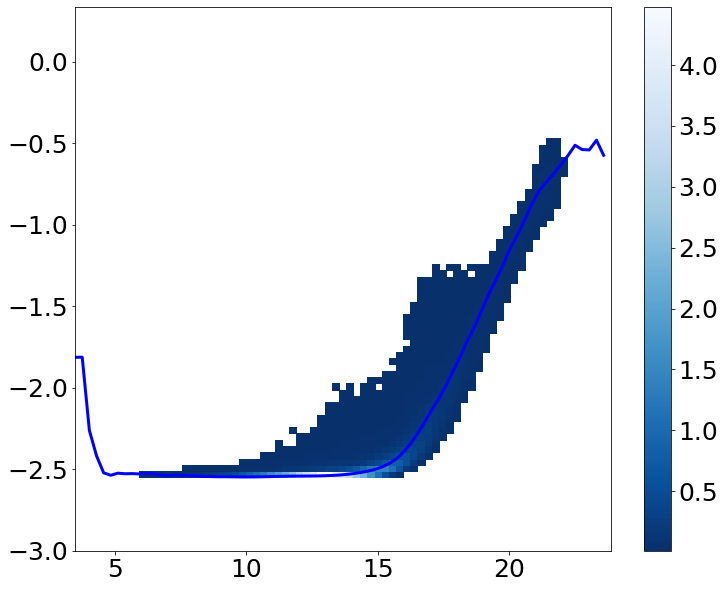

In [24]:
bp_fin = np.where(np.isfinite(gaiaedr3['phot_bp_mean_mag'])==True)

bpmin = min(gaiaedr3['phot_bp_mean_mag'][bp_fin])
bpmax = max(gaiaedr3['phot_bp_mean_mag'][bp_fin])

bpdiff = bpmax-bpmin
bpfluxerr = (2.5*0.434)/gaiaedr3['phot_bp_mean_flux_over_error'][bp_fin]
bpmagerr = np.sqrt((bpfluxerr)**2+0.0028**2)

binnum = 75
bpbin ,_,_ = binned_statistic(gaiaedr3['phot_bp_mean_mag'][bp_fin],np.log10(bpmagerr),'median',bins=binnum)

plt.figure(figsize=[12,10])
plt.hist2d(gaiaedr3['phot_bp_mean_mag'][bp_fin],np.log10(bpmagerr),bins=binnum,density=True,cmin=0.01,
           cmap='Blues_r')
plt.colorbar()

plt.plot(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin,lw=3.0,c='blue')
plt.ylim(bottom=-3.0)

(-3.0, 0.4064217805862427)

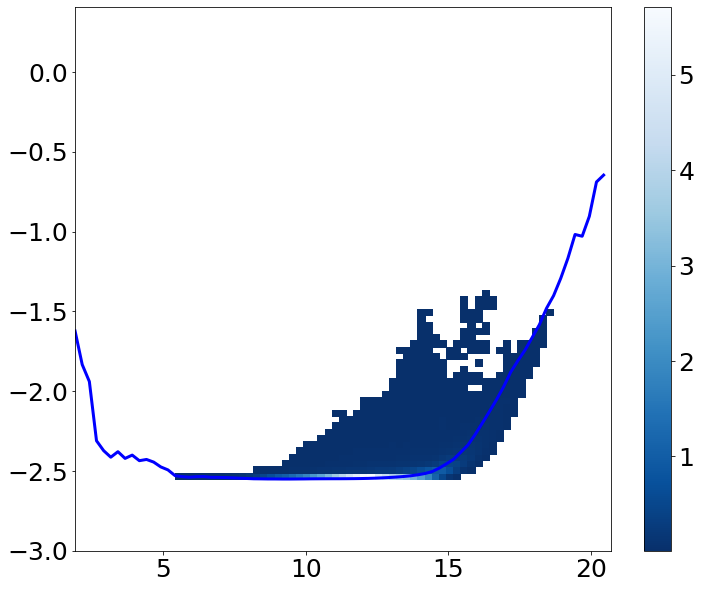

In [25]:
rp_fin = np.where(np.isfinite(gaiaedr3['phot_rp_mean_mag'])==True)

rpmin = min(gaiaedr3['phot_rp_mean_mag'][rp_fin])
rpmax = max(gaiaedr3['phot_rp_mean_mag'][rp_fin])

rpdiff = rpmax-rpmin
rpfluxerr = (2.5*0.434)/gaiaedr3['phot_rp_mean_flux_over_error'][rp_fin]
rpmagerr = np.sqrt((rpfluxerr)**2+0.0028**2)

binnum = 75
rpbin ,_,_ = binned_statistic(gaiaedr3['phot_rp_mean_mag'][rp_fin],np.log10(rpmagerr),'median',bins=binnum)

plt.figure(figsize=[12,10])
plt.hist2d(gaiaedr3['phot_rp_mean_mag'][rp_fin],np.log10(rpmagerr),bins=binnum,density=True,cmin=0.01,
           cmap='Blues_r')
plt.colorbar()

plt.plot(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin,lw=3.0,c='blue')
plt.ylim(bottom=-3.0)

Text(0, 0.5, 'Log(Error)')

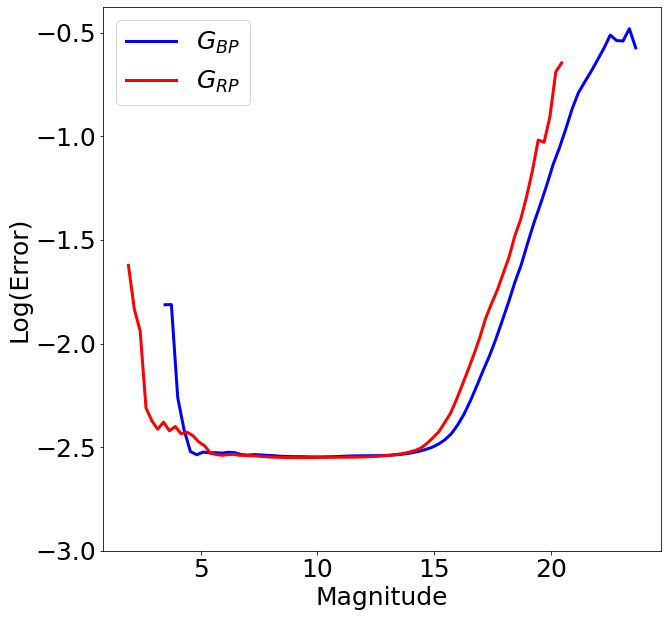

In [26]:
plt.figure(figsize=[10,10])
plt.plot(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin,lw=3.0,c='blue',label=r'$G_{BP}$')
plt.plot(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin,lw=3.0,c='red',label=r'$G_{RP}$')
plt.legend()
plt.ylim(bottom=-3.0)
plt.xlabel('Magnitude')
plt.ylabel('Log(Error)')

In [27]:
bperrfunc = InterpolatedUnivariateSpline(np.arange(bpmin,bpmax,bpdiff/binnum),bpbin)
rperrfunc = InterpolatedUnivariateSpline(np.arange(rpmin,rpmax,rpdiff/binnum),rpbin)

bperr = 10**bperrfunc(gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'])
rperr = 10**rperrfunc(gcsdr17['GAIAEDR3_PHOT_RP_MEAN_MAG'])

In [29]:
p0=[12.0,0.5]
idx = 1024
cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                    gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])

CalcAge = AetasStellae(gcsdr17['LOGG'][idx],shiftfeh[idx],cnalpha,10000,3.1,massive)

obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][idx],
                     gcsdr17['J'][idx],gcsdr17['H'][idx],gcsdr17['K'][idx]],dtype=float).T.ravel()
obs_mags_err = np.array([bperr[idx],rperr[idx],gcsdr17['J'][idx],gcsdr17['H'][idx],
                         gcsdr17['K'][idx]],dtype=float).T.ravel()

popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][idx],obs_mags,p0=p0,bounds=((0.,0.),(14.,2.)),
                      method='trf',sigma=obs_mags_err,absolute_sigma=True)

print('Initial',p0)
print('Age; Ak',popt)
print(pcov)
print(np.sqrt(pcov[0][0]))
print(np.sqrt(pcov[1][1]))

Initial [12.0, 0.5]
Age; Ak [5.49990355 0.0225739 ]
[[ 4.29631746e-01 -3.95396116e-03]
 [-3.95396116e-03  3.64968146e-05]]
0.6554630015539734
0.006041259356369915


In [30]:
shiftfeh[gcs0]

<ipython-input-30-848052a34c0e>:1: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  shiftfeh[gcs0]


array([[-0.71750003, -0.82117999, -0.88055998, -0.78272999, -0.81357998,
        -0.78638   , -0.76995999, -0.86370003, -0.83661002, -0.90578002,
        -0.81592   , -0.81915999, -0.87257999, -0.86098999, -0.87649   ,
        -0.81011003, -0.82639003, -0.77680999, -0.74250001, -0.79194999,
        -0.85336   , -0.84395004, -0.82815999, -0.79003   , -0.87092   ,
        -0.85132003, -0.94656003, -0.88625002, -0.89639002, -0.86163002,
        -0.80609   , -0.76476002, -0.86247003, -0.79802001, -0.77835   ,
        -0.90929002, -0.74562001, -0.81603003, -0.86243999, -0.78305   ,
        -0.93375004, -0.80567998, -0.78685999, -0.79772002, -0.85794002,
        -0.79387003, -0.76218999, -0.92544002, -0.88844002, -0.88757003,
        -0.81637001, -0.07905001, -0.82542998, -0.8204    , -0.83148003,
        -0.84943998, -0.87059999, -0.88358999, -0.78104002, -0.84004003,
        -0.88958001, -0.85140002, -0.73475003, -0.81075001, -0.87886   ,
        -0.82738   , -0.73042   , -0.82306999, -0.7

In [31]:
### Run All Stars
guess_ages = np.arange(0,14)
guess_aks = np.array([0,0.5,1.0])

best_ages = 999999.0*np.ones(len(gcsdr17))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))
best_aks = 999999.0*np.ones(len(gcsdr17))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))
best_ages_err = 999999.0*np.ones(len(gcsdr17))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))
best_aks_err = 999999.0*np.ones(len(gcsdr17))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))
best_chis = 999999.0*np.ones(len(gcsdr17))#np.ones((len(gcs),len(guess_ages),len(guess_aks)))


for i in tqdm_notebook(range(len(gcs))):
    curve_ages = []
    curve_aks = []
    curve_ages_err = []
    curve_aks_err = []
    curve_chi = []
    
    cnalpha = np.array([gcsdr17['C_FE'][i],gcsdr17['N_FE'][i],gcsdr17['O_FE'][i],gcsdr17['MG_FE'][i],
                        gcsdr17['SI_FE'][i],gcsdr17['S_FE'][i],gcsdr17['CA_FE'][i],gcsdr17['TI_FE'][i]])
    
    CalcAge = AetasStellae(gcsdr17['LOGG'][i],shiftfeh[i],cnalpha,gcs_dist[i],3.1,massive)
    for j in range(len(guess_ages)):
        for k in range(len(guess_aks)):
            try:
                obs_mags = np.array([gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][i],
                                     gcsdr17['GAIAEDR3_PHOT_BP_MEAN_MAG'][i],
                                     gcsdr17['J'][i],gcsdr17['H'][i],
                                     gcsdr17['K'][i]],dtype=float).T.ravel()
                
                obs_sigs = np.array([bperr[i],rperr[i],gcsdr17['J'][i],gcsdr17['H'][i],gcsdr17['K'][i]],
                                    dtype=float).T.ravel()
                
                popt,pcov = curve_fit(CalcAge.Teff2AppMags,gcsdr17['TEFF'][i],
                                   obs_mags,p0=[guess_ages[j],guess_aks[k]],bounds=((0.,0.),(14.,2.)),
                                   method='trf',sigma=obs_sigs,absolute_sigma=True,maxfev=5000)
            
                curve_ages.append(popt[0])
                curve_aks.append(popt[1])
                curve_ages_err.append(np.sqrt(pcov[0][0]))
                curve_aks_err.append(np.sqrt(pcov[1][1]))
                curve_mags = np.asarray(CalcAge.Teff2AppMags(gcsdr17['TEFF'][i],popt[0],popt[1]))
                curve_chi.append(sum((curve_mags-obs_mags)**2/obs_sigs**2))
            
            except:
#                 print([i,j,k])
                curve_ages.append(999999.0)
                curve_aks.append(999999.0)
                curve_ages_err.append(999999.0)
                curve_aks_err.append(999999.0)
                curve_chi.append(999999.0)
                
    best_idx = np.asarray(curve_chi).argmin()
    best_chis[i] = np.min(curve_chi)
    best_ages[i] = np.asarray(curve_ages)[best_idx]
    best_aks[i] = np.asarray(curve_aks)[best_idx]
    best_ages_err[i] = np.asarray(curve_ages_err)[best_idx]
    best_aks_err[i] = np.asarray(curve_aks_err)[best_idx]

<ipython-input-31-4443fdb8db6a>:12: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i in tqdm_notebook(range(len(gcs))):


(array([ 343.,  111.,  177.,   81.,   37.,   39.,   45.,   21.,   28.,
        1318.]),
 array([ 0. ,  1.4,  2.8,  4.2,  5.6,  7. ,  8.4,  9.8, 11.2, 12.6, 14. ]),
 <a list of 10 Patch objects>)

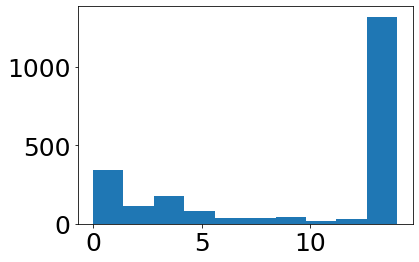

In [32]:
plt.hist(best_ages,range=(0.,14.0))

(-3.296234345698024, 10.0)

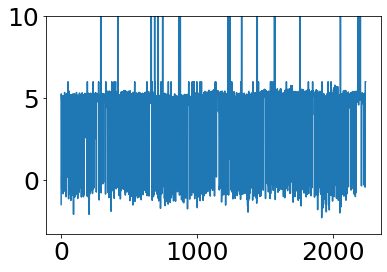

In [33]:
plt.plot(np.log10(best_chis))
plt.ylim(top=10)

(0.0, 14.0)

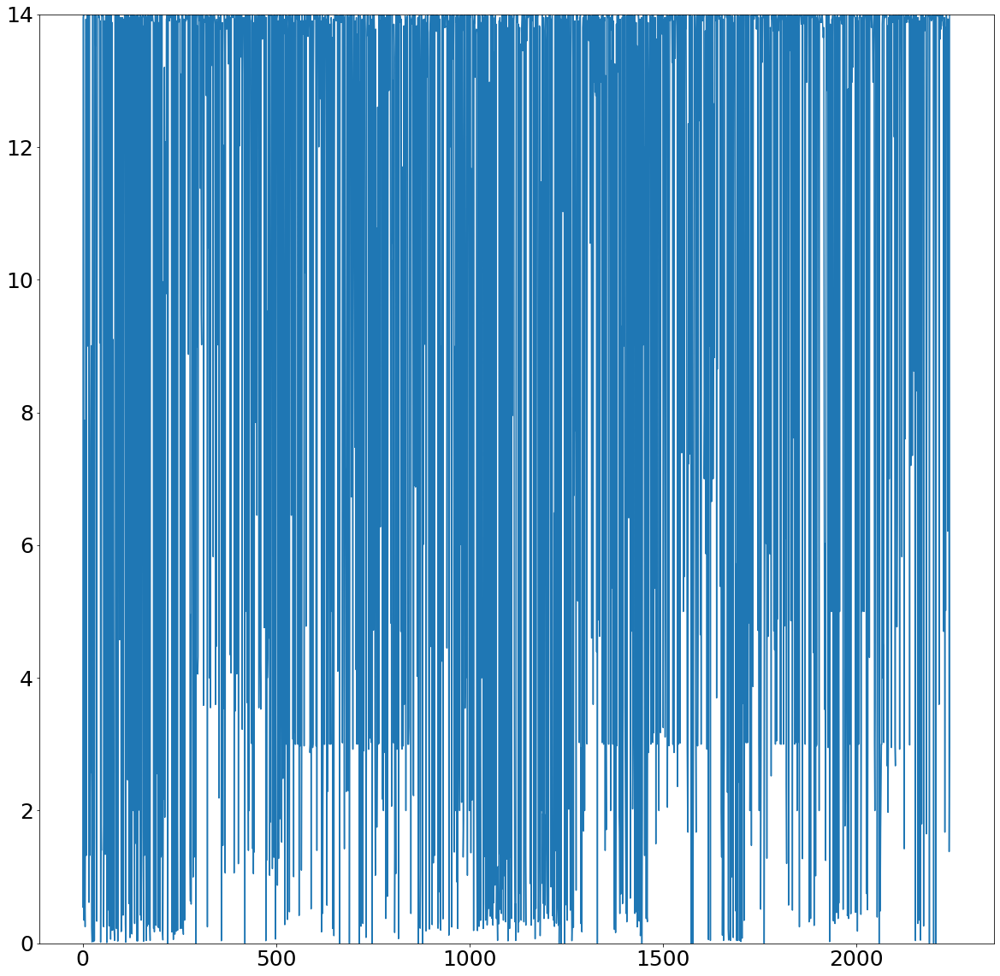

In [34]:
plt.figure(figsize=[20,20])
plt.plot(best_ages)
plt.ylim(0,14)

In [35]:
calc_clus_ages = np.array([])
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i])&(best_ages!=999999.0))
    calc_clus_ages = np.append(calc_clus_ages,np.median(best_ages[clus]))
    
print(calc_clus_ages)

[13.65007361 13.89984637  8.03870401 10.64995119 13.84984779 13.97494159
 13.76243171 13.8749041  13.9498647  13.01248365 12.22499514 13.79987018
  7.17496858 13.79987285 13.94986485 13.97494447 13.76243164 13.77494898
 13.97494158 13.92483227 13.87490446 13.92483263 13.79997224 13.84984789
 11.23747183  6.99101767 13.74991403 13.8499499  13.89984632 13.97494136]


In [36]:
1906-18

1888

In [37]:
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i]))
    print(np.median(shiftfeh[clus]))

-0.8149499917030334
-1.589649977684021
-1.0530349934101104
-1.3490499877929687
-1.562700035572052
-2.3717500591278076
-1.7981500053405761
-1.5517500066757202
-1.7691500210762023
-1.4805499935150146
-1.1173500442504882
-1.2800999903678894
-1.9679500484466552
-1.4646000289916992
-1.8304500007629394
-2.3043500804901123
-0.8404549980163574
-1.5572499656677246
-2.3223500871658325
-1.1793999695777893
-1.1560500288009643
-1.3302999758720397
-1.415950002670288
-1.1842499995231628
-2.296950044631958
-1.8840499544143676
-0.5485100173950195
-0.5492399954795837
-1.5452500009536743
-0.8152499818801879


In [38]:
vanden_age

array([11.75, 11.75, 12.  , 13.  , 12.  , 12.75, 11.9 , 11.75, 12.5 ,
       11.75, 11.5 , 11.5 , 12.25, 11.75, 13.  , 12.  , 11.  , 11.  ,
       12.75, 11.  , 11.  , 11.5 , 11.5 , 11.75, 12.25, 12.5 , 11.25,
       12.03, 12.5 , 11.26])

In [39]:
pwd

'/Users/joshuapovick/Desktop/Research/LMC_Ages/Age_Fitting'

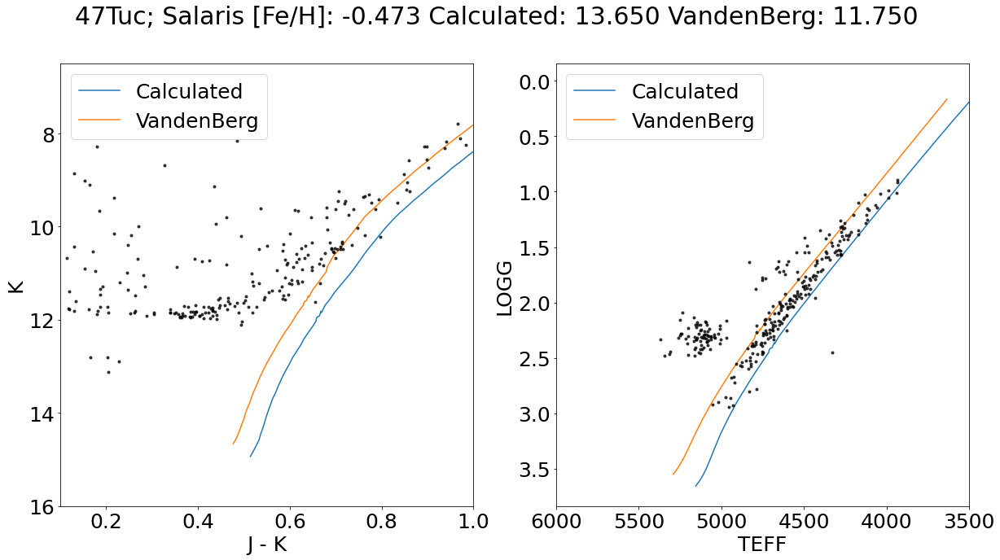

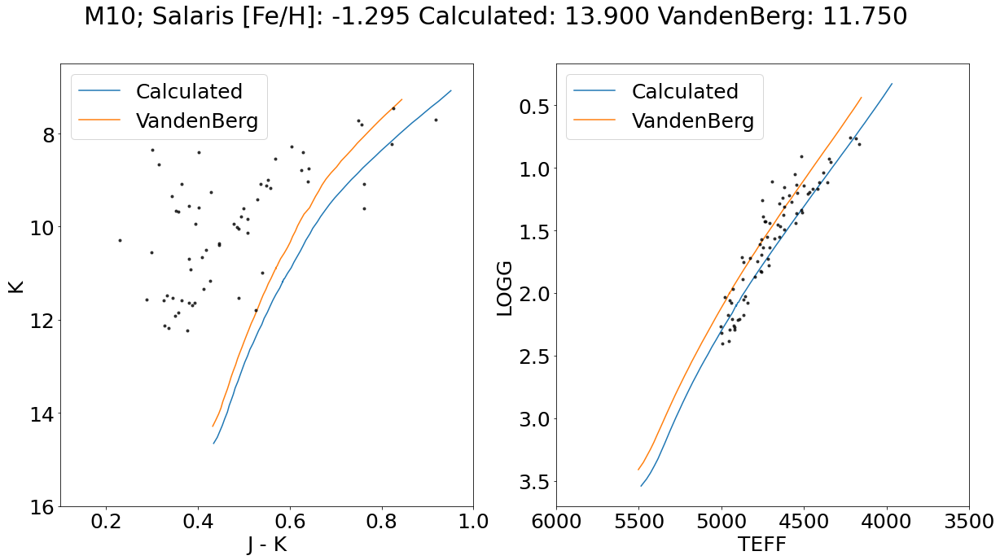

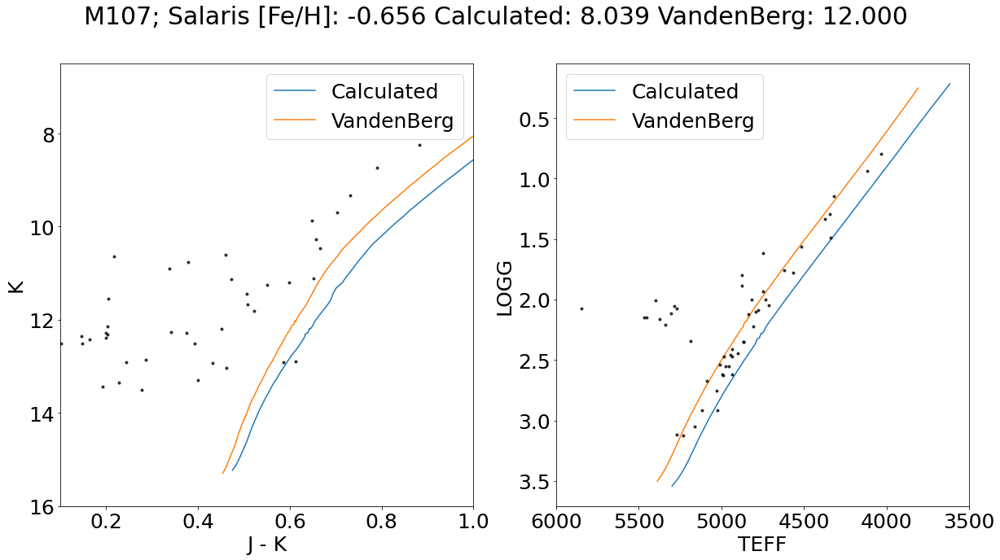

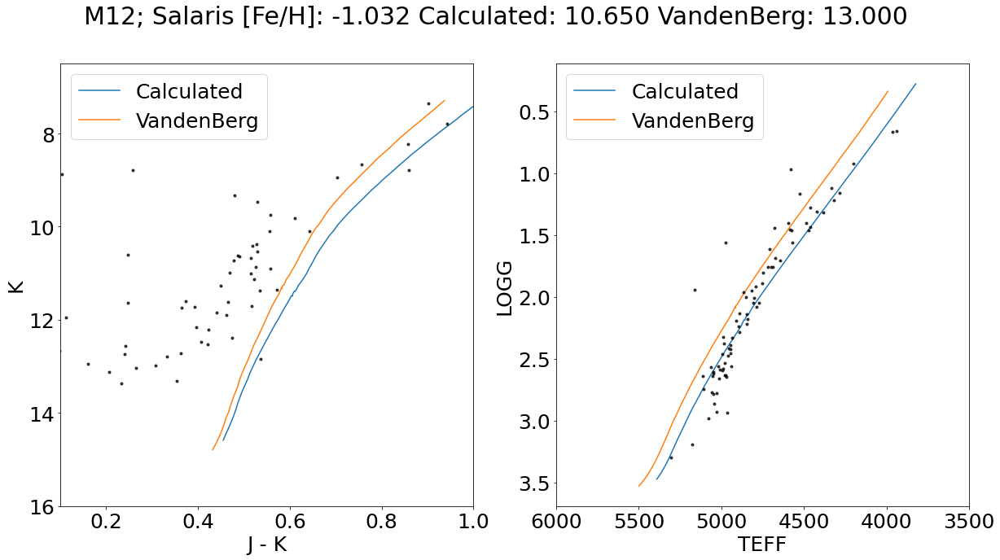

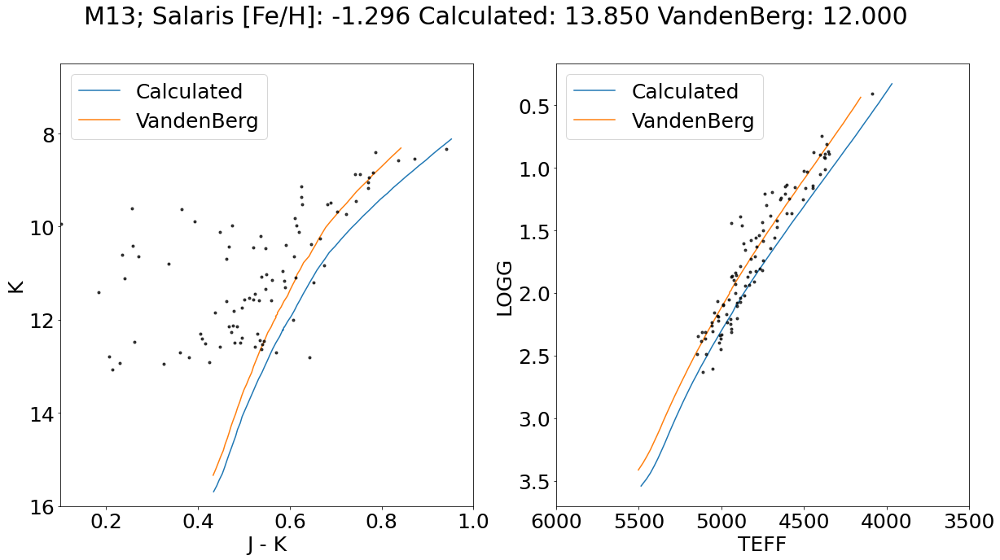

...

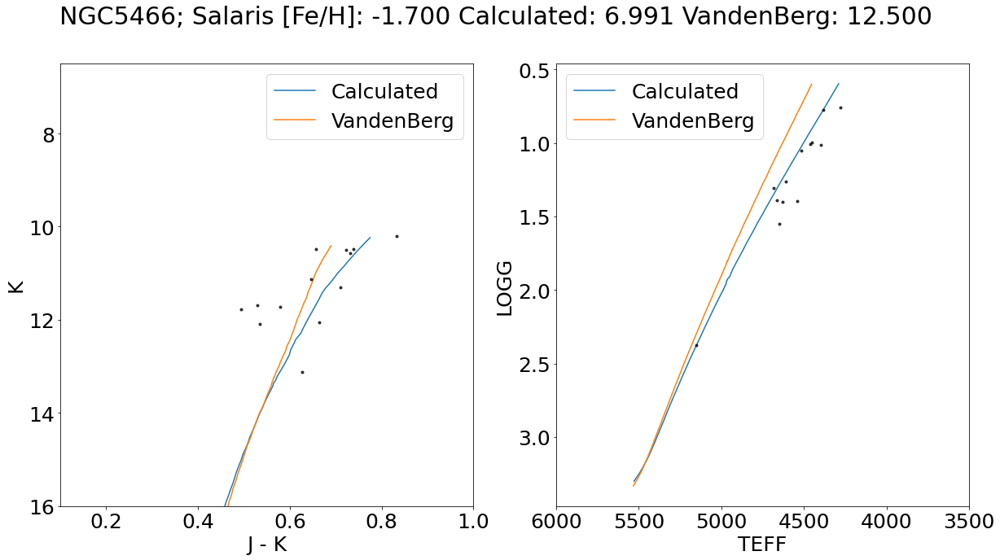

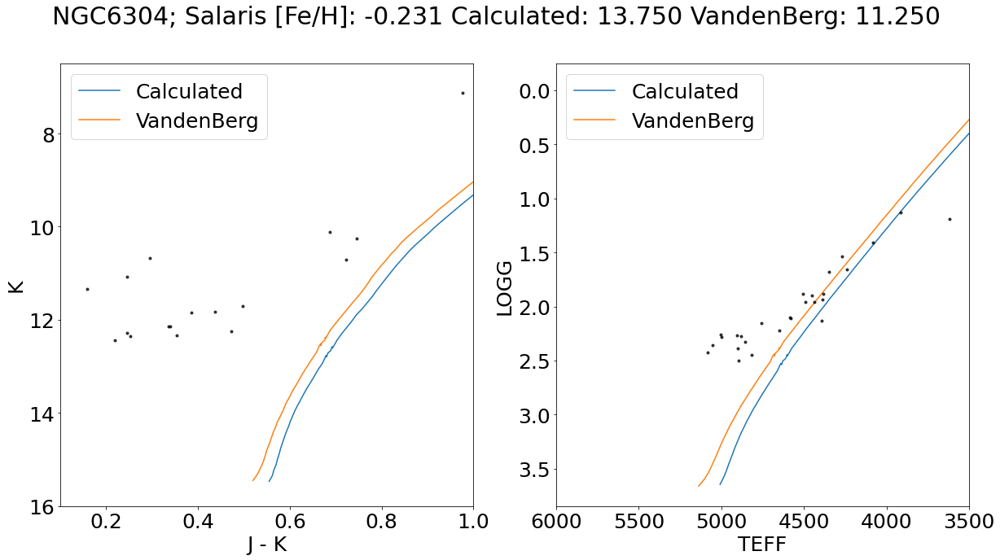

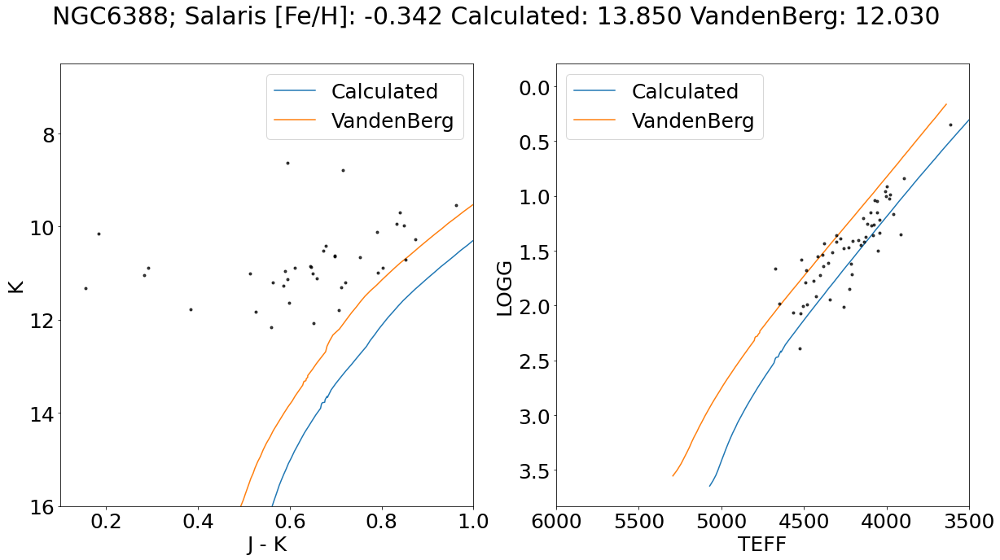

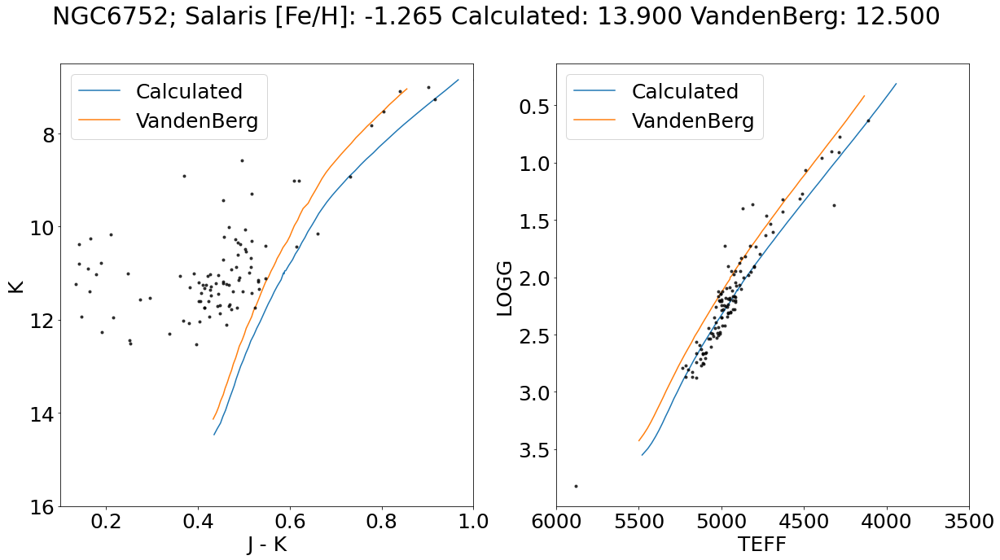

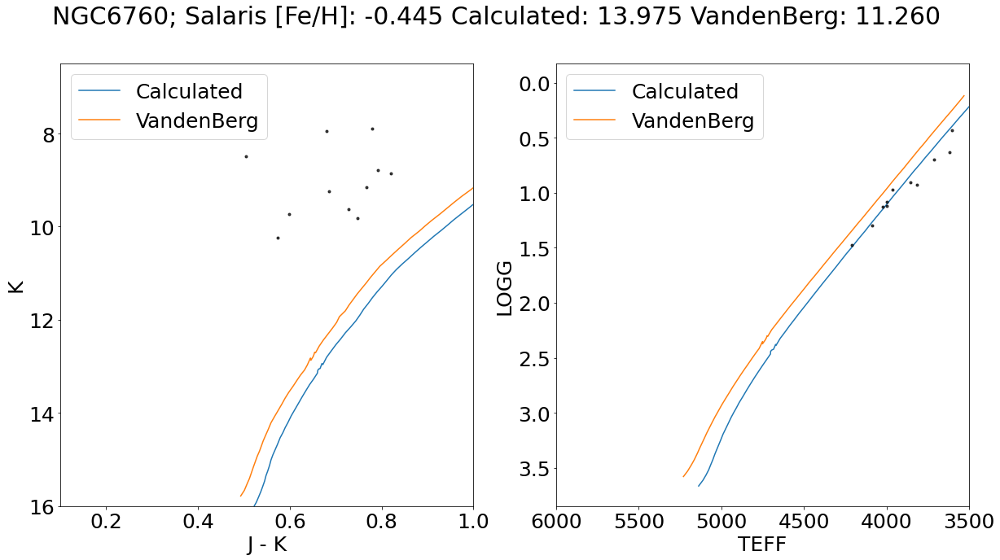

In [41]:
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i]))#&(best_aks!=999999.0))
    isopick = np.where((massive['MH']==closest(massive['MH'],np.median(all_sal_feh[clus])))&
                       (massive['logAge']==closest(massive['logAge'],np.log10(calc_clus_ages[i]*10**9))))
    
    calc_sort = np.argsort(massive['logTe'][isopick])
    
    isopick2 = np.where((massive['MH']==closest(massive['MH'],np.median(vanden_feh[i])))&
                       (massive['logAge']==closest(massive['logAge'],np.log10(vanden_age[i]*10**9))))
    
    vand_sort = np.argsort(massive['logTe'][isopick2])
    
    fig, ax = plt.subplots(1,2,figsize=[20,10])
    ax[0].plot((massive['Jmag']-massive['Ksmag'])[isopick][calc_sort],
                  massive['Ksmag'][isopick][calc_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='Calculated')
    ax[0].plot((massive['Jmag']-massive['Ksmag'])[isopick2][vand_sort],
                  massive['Ksmag'][isopick2][vand_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='VandenBerg')
    ax[0].legend()
    ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus],gcsdr17['K'][clus]-best_aks[clus],c='k',
                  marker='.',zorder=1,alpha=0.75)
    ax[0].set_xlim(0.1,1.0)
    ax[0].set_ylim(6.5,16)
    ax[0].invert_yaxis()
    ax[0].set_xlabel(r'J - K')
    ax[0].set_ylabel(r'K')
    
    ax[1].plot(10**massive['logTe'][isopick][calc_sort],massive['logg'][isopick][calc_sort],
                  zorder=0,label='Calculated')
    ax[1].plot(10**massive['logTe'][isopick2][vand_sort],massive['logg'][isopick2][vand_sort],
                  zorder=0,label='VandenBerg')
    ax[1].legend()
    ax[1].scatter(gcsdr17['TEFF'][clus],gcsdr17['LOGG'][clus],c='k',marker='.',zorder=1,alpha=0.75)
    ax[1].set_xlim(3500,6000)
    ax[1].set_xlabel(r'TEFF')
    ax[1].set_ylabel(r'LOGG')
    ax[1].invert_yaxis()
    ax[1].invert_xaxis()
    
    plt.suptitle(r'{}; Salaris [Fe/H]: {:.3f} Calculated: {:.3f} VandenBerg: {:.3f} '.format(gcs_clus[i],
                                                                                np.median(all_sal_feh[clus]),
                                                                                calc_clus_ages[i],vanden_age[i]))
    plt.savefig('{}CMDHRGaiaOffset_logg_weight.pdf'.format(gcs_clus[i]),bbox_inches='tight')
    plt.show()

In [158]:
print(best_ages[np.where((gcs['CLUSTER']==gcs_clus[1])&(best_aks!=999999.0))])
print(vanden_age[1])

[13.94986484 13.97494154 13.47488312 14.         14.         13.57500515
 14.         14.         13.97494155 14.         13.92483321 14.
 13.94986485 14.         13.94986494 14.         13.97494154 14.
 13.94986483 14.         14.         14.         13.97494157 13.94986491
 13.97494153 14.         14.         14.         14.         14.
 14.         14.         14.         14.         13.97494151 14.
 13.97494158 14.         13.97494153 13.94986481 14.         14.
 13.97494155 13.94986476 14.         14.         13.97494157 13.94986485
 14.         13.97494158 14.         13.97494154 14.         14.
 14.         13.97494162 14.         13.94986484 13.94986482 13.97494155
 12.52492137 13.92483316 13.97494154 14.         13.52492921 14.
 13.97494154 14.         13.87490442 14.         14.         12.9500069
 13.84984792 13.04998455 14.        ]
11.75


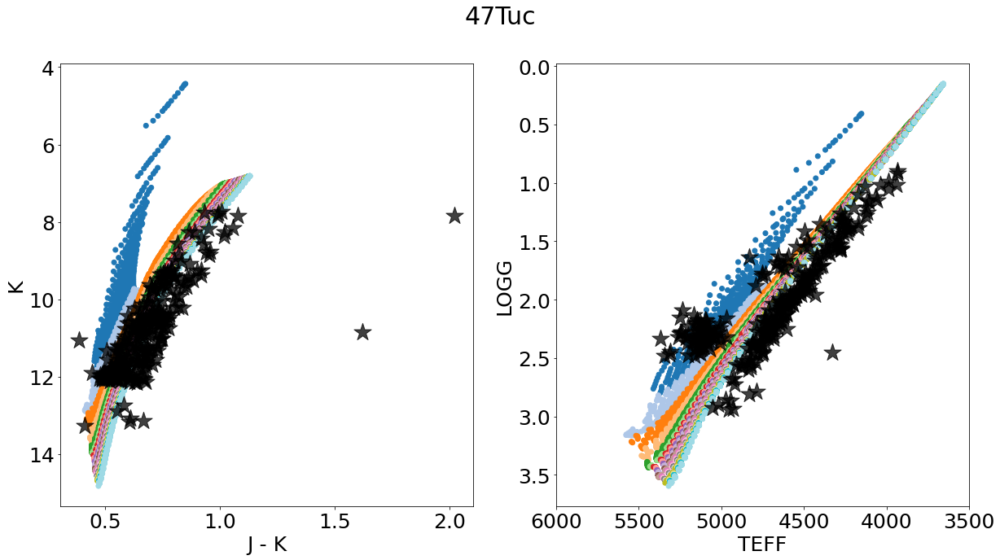

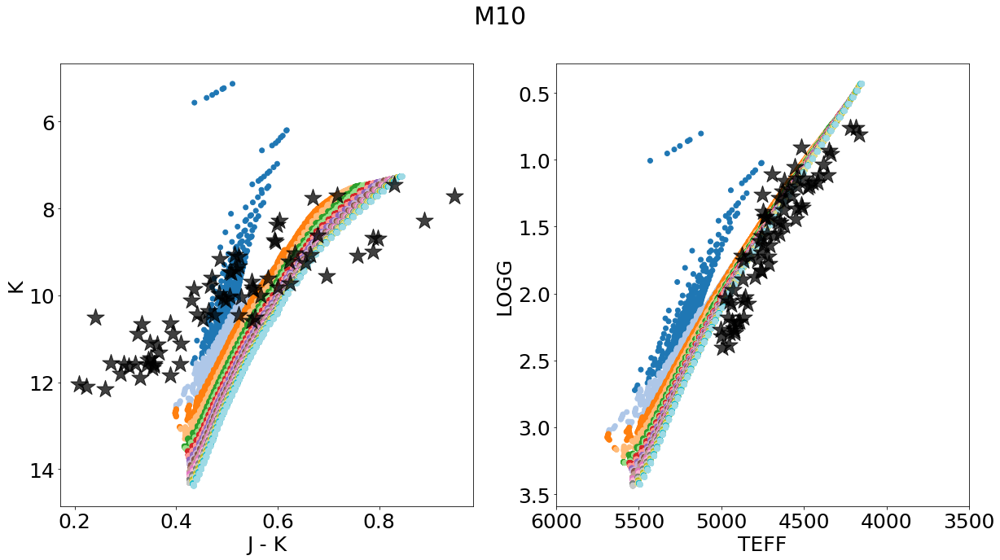

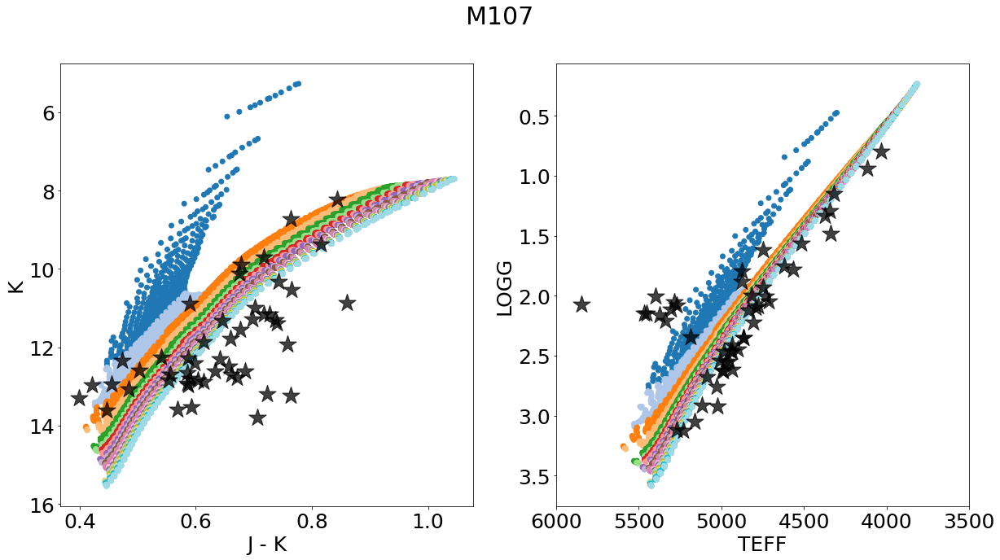

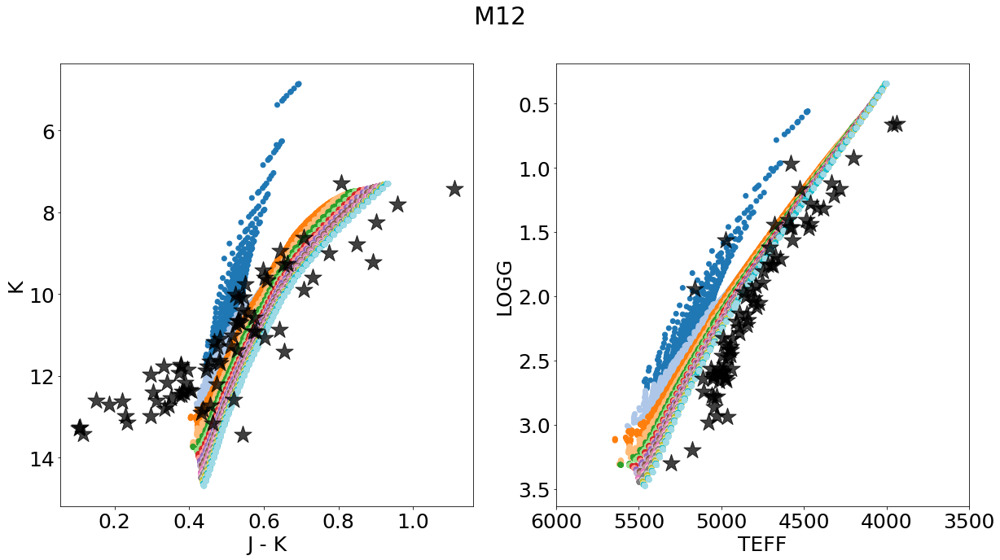

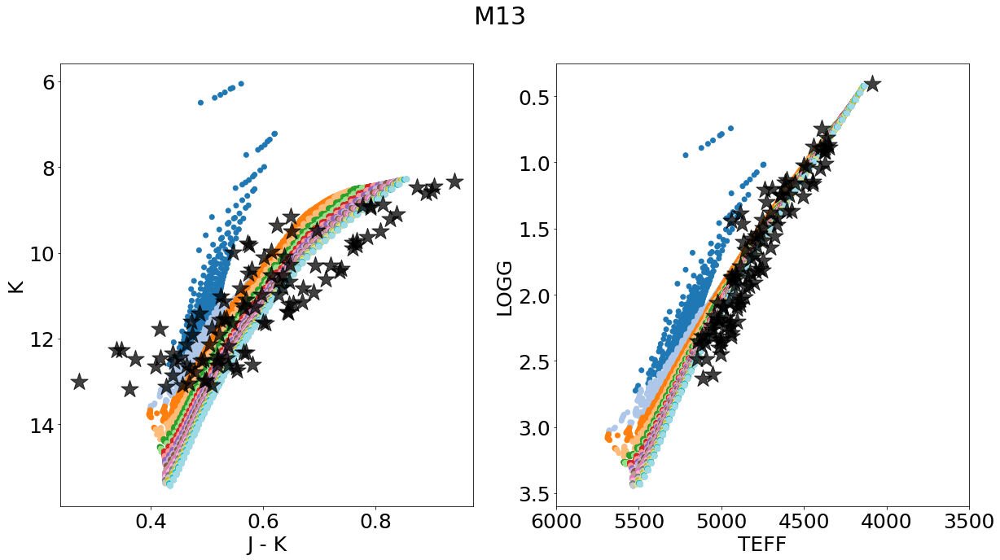

...

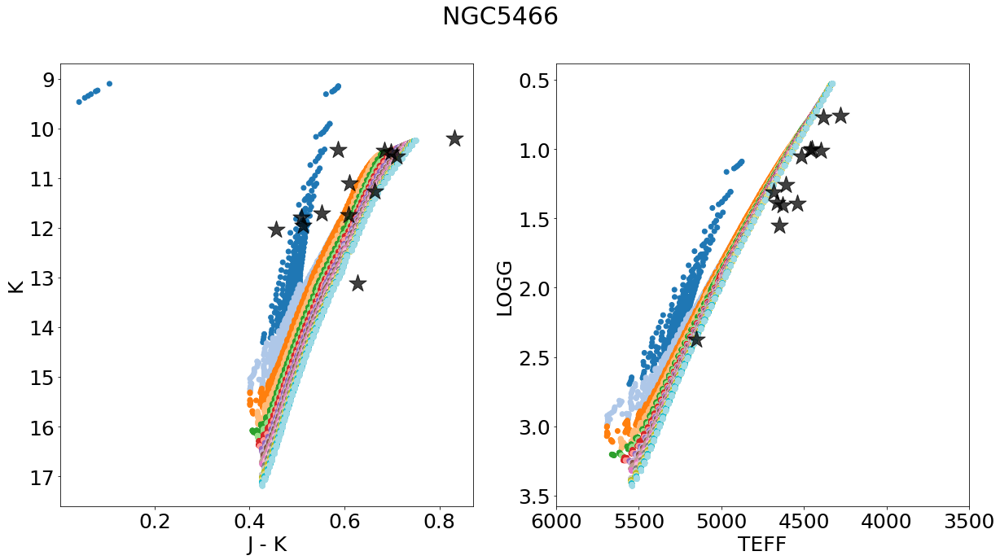

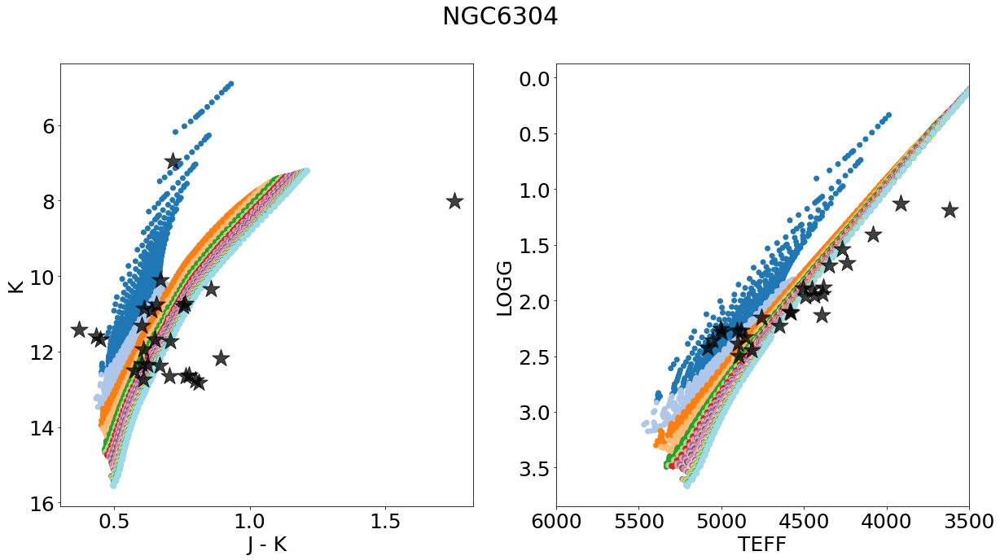

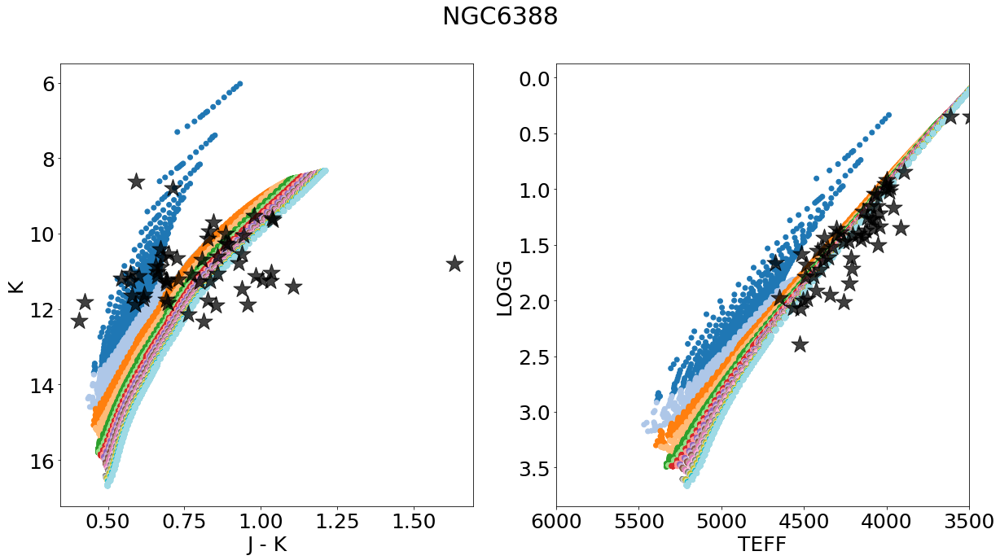

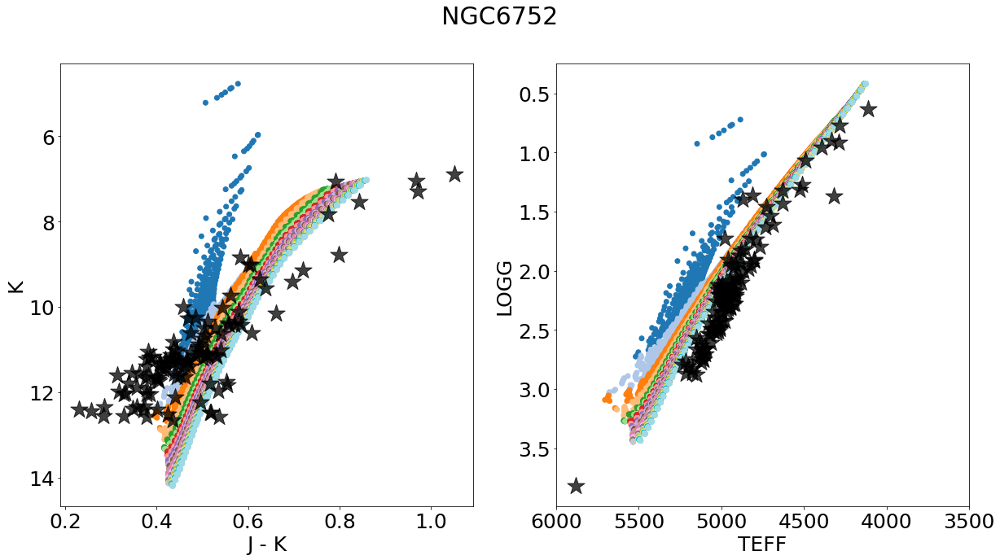

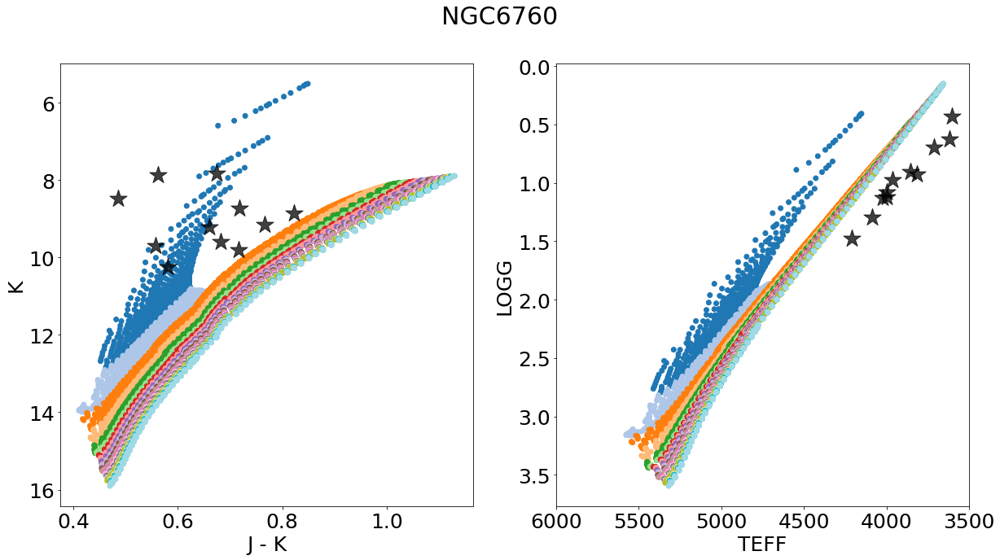

In [146]:
for i in range(len(gcs_clus)):
    clus = np.where((gcs['CLUSTER']==gcs_clus[i])&(best_aks!=999999.0))
    isopick = np.where(massive['MH']==closest(massive['MH'],np.median(shiftfeh[clus])))
    
    fig, ax = plt.subplots(1,2,figsize=[20,10])
    ax[0].scatter((massive['Jmag']-massive['Ksmag'])[isopick],
                  massive['Ksmag'][isopick]+5.*np.log10(harris_dist[i])-5.0,
                  c=10**massive['logAge'][isopick]/10**9,cmap='tab20',zorder=0)
    ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus],gcsdr17['K'][clus]-best_aks[clus],c='k',
                  marker='*',s=500,zorder=1,alpha=0.75)
    ax[0].invert_yaxis()
    ax[0].set_xlabel(r'J - K')
    ax[0].set_ylabel(r'K')
    
    ax[1].scatter(10**massive['logTe'][isopick],massive['logg'][isopick],c=10**massive['logAge'][isopick]/10**9,
                  cmap='tab20',zorder=0)
    ax[1].scatter(gcsdr17['TEFF'][clus],gcsdr17['LOGG'][clus],c='k',marker='*',s=500,zorder=1,alpha=0.75)
    ax[1].set_xlim(3500,6000)
    ax[1].set_xlabel(r'TEFF')
    ax[1].set_ylabel(r'LOGG')
    ax[1].invert_yaxis()
    ax[1].invert_xaxis()
    
    plt.suptitle(r'{}'.format(gcs_clus[i]))
#     plt.savefig('{}CMDHR.pdf'.format(gcs_clus[i]),bbox_inches='tight')
#     plt.title(r'K, J - K; {}; Color as Age'.format(gcs_clus[i]))
    plt.show()

# Age - Magnitude Diagnostic Plot

In [237]:
m22_idx = np.where(gcs['CLUSTER']=='M22')

(array([8]),)

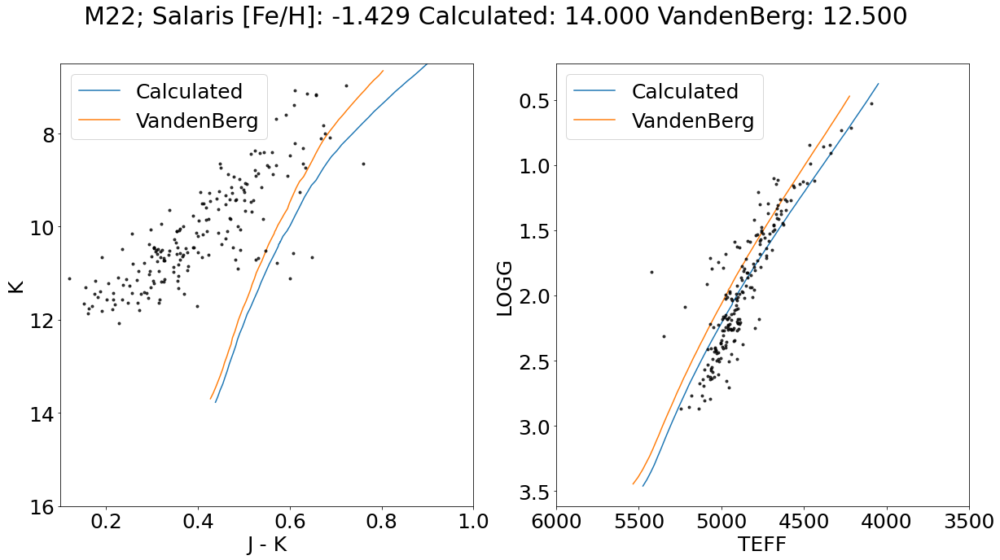

In [315]:
i = np.where(gcs_clus=='M22')
clus = np.where(gcs['CLUSTER']=='M22')#np.where((gcs['CLUSTER']==gcs_clus[i]))
isopick = np.where((massive['MH']==closest(massive['MH'],np.median(all_sal_feh[clus])))&
                    (massive['logAge']==closest(massive['logAge'],np.log10(calc_clus_ages[i]*10**9))))
    
calc_sort = np.argsort(massive['logTe'][isopick])
    
isopick2 = np.where((massive['MH']==closest(massive['MH'],np.median(vanden_feh[i])))&
                       (massive['logAge']==closest(massive['logAge'],np.log10(vanden_age[i]*10**9))))
    
vand_sort = np.argsort(massive['logTe'][isopick2])
    
fig, ax = plt.subplots(1,2,figsize=[20,10])
ax[0].plot((massive['Jmag']-massive['Ksmag'])[isopick][calc_sort],
                  massive['Ksmag'][isopick][calc_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='Calculated')
ax[0].plot((massive['Jmag']-massive['Ksmag'])[isopick2][vand_sort],
                  massive['Ksmag'][isopick2][vand_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='VandenBerg')
ax[0].legend()
ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus],gcsdr17['K'][clus]-best_aks[clus],c='k',
                  marker='.',zorder=1,alpha=0.75)
ax[0].set_xlim(0.1,1.0)
ax[0].set_ylim(6.5,16)
ax[0].invert_yaxis()
ax[0].set_xlabel(r'J - K')
ax[0].set_ylabel(r'K')
    
ax[1].plot(10**massive['logTe'][isopick][calc_sort],massive['logg'][isopick][calc_sort],
                  zorder=0,label='Calculated')
ax[1].plot(10**massive['logTe'][isopick2][vand_sort],massive['logg'][isopick2][vand_sort],
                  zorder=0,label='VandenBerg')
ax[1].legend()
ax[1].scatter(gcsdr17['TEFF'][clus],gcsdr17['LOGG'][clus],c='k',marker='.',zorder=1,alpha=0.75)
ax[1].set_xlim(3500,6000)
ax[1].set_xlabel(r'TEFF')
ax[1].set_ylabel(r'LOGG')
ax[1].invert_yaxis()
ax[1].invert_xaxis()
    
plt.suptitle(r'M22; Salaris [Fe/H]: {:.3f} Calculated: {:.3f} VandenBerg: {:.3f} '.format(
                                                                                np.median(all_sal_feh[clus]),
                                                                                calc_clus_ages[8],vanden_age[8]));

In [184]:
np.where((gcs['APOGEE_ID']==gcsdr17['APOGEE_ID'])==False)

(array([], dtype=int64),)

In [191]:
closest((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus],0.16)

nan

In [192]:
np.where(np.isfinite((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus])==False)

(array([202, 203]),)

In [197]:
def euclid2d(data,pt):
    x1,y1 = data
    x0,y0 = pt
    euc = np.subtract(x1,x0)**2+np.subtract(y1,y0)**2
    return euc.argmin()

In [217]:
euclid2d(np.array([(gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][:201],(gcsdr17['K']-best_aks)[clus][:201]]),
         np.array([0.5,7]))

23

In [206]:
euclid2d(np.array([(gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][:201],(gcsdr17['K']-best_aks)[clus][:201]]),
         np.array([0.4,10]))

136

In [208]:
euclid2d(np.array([(gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][:201],(gcsdr17['K']-best_aks)[clus][:201]]),
         np.array([0.2,12]))

118

In [213]:
euclid2d(np.array([(gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][:201],(gcsdr17['K']-best_aks)[clus][:201]]),
         np.array([0.0,10]))

36

In [219]:
euclid2d(np.array([(gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][:201],(gcsdr17['K']-best_aks)[clus][:201]]),
         np.array([0.5,9]))

151

Text(0, 0.5, 'K')

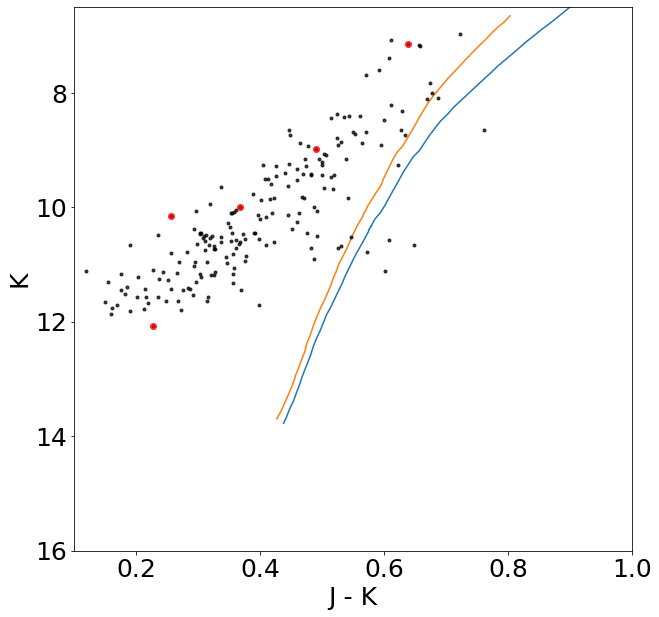

In [309]:
plt.figure(figsize=[10,10])
plt.plot((massive['Jmag']-massive['Ksmag'])[isopick][calc_sort],
                  massive['Ksmag'][isopick][calc_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='Calculated')
plt.plot((massive['Jmag']-massive['Ksmag'])[isopick2][vand_sort],
                  massive['Ksmag'][isopick2][vand_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='VandenBerg')

plt.scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus],(gcsdr17['K']-best_aks)[clus],c='k',
                  marker='.',zorder=1,alpha=0.75)

plt.scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][23],(gcsdr17['K']-best_aks)[clus][23],c='r',
                  zorder=1,alpha=0.75)
plt.scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][136],(gcsdr17['K']-best_aks)[clus][136],c='r',
                  zorder=1,alpha=0.75)
plt.scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][118],(gcsdr17['K']-best_aks)[clus][118],c='r',
                  zorder=1,alpha=0.75)
plt.scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][36],(gcsdr17['K']-best_aks)[clus][36],c='r',
                  zorder=1,alpha=0.75)
plt.scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][151],(gcsdr17['K']-best_aks)[clus][151],c='r',
                  zorder=1,alpha=0.75)

plt.xlim(0.1,1.0)
plt.ylim(6.5,16)
plt.gca().invert_yaxis()
plt.xlabel(r'J - K')
plt.ylabel(r'K')

Text(0, 0.5, 'LOGG')

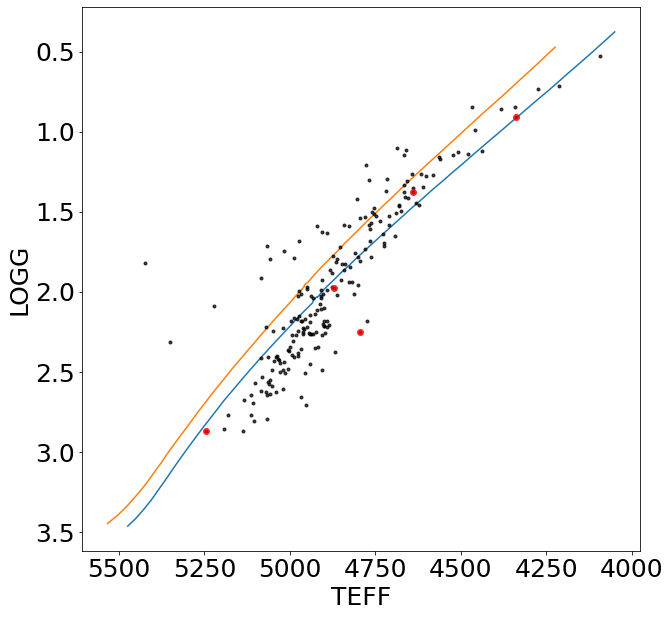

In [310]:
plt.figure(figsize=[10,10])
plt.plot(10**massive['logTe'][isopick][calc_sort],massive['logg'][isopick][calc_sort],zorder=0,label='Calculated')
plt.plot(10**massive['logTe'][isopick2][vand_sort],massive['logg'][isopick2][vand_sort],
         zorder=0,label='VandenBerg')

plt.scatter(gcsdr17['TEFF'][clus],gcsdr17['LOGG'][clus],c='k',marker='.',zorder=1,alpha=0.75)

plt.scatter(gcsdr17['TEFF'][clus][23],gcsdr17['LOGG'][clus][23],c='r',zorder=1,alpha=0.75)
plt.scatter(gcsdr17['TEFF'][clus][136],gcsdr17['LOGG'][clus][136],c='r',zorder=1,alpha=0.75)
plt.scatter(gcsdr17['TEFF'][clus][118],gcsdr17['LOGG'][clus][118],c='r',zorder=1,alpha=0.75)
plt.scatter(gcsdr17['TEFF'][clus][36],gcsdr17['LOGG'][clus][36],c='r',zorder=1,alpha=0.75)
plt.scatter(gcsdr17['TEFF'][clus][151],gcsdr17['LOGG'][clus][151],c='r',zorder=1,alpha=0.75)

# plt.xlim(0.1,1.0)
# plt.ylim(6.5,16)
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()
plt.xlabel(r'TEFF')
plt.ylabel(r'LOGG')

In [5]:
i = np.where(gcs_clus=='M22')
clus = np.where(gcs['CLUSTER']=='M22')#np.where((gcs['CLUSTER']==gcs_clus[i]))
isopick = np.where((massive['MH']==closest(massive['MH'],np.median(all_sal_feh[clus])))&
                    (massive['logAge']==closest(massive['logAge'],np.log10(calc_clus_ages[i]*10**9))))
    
calc_sort = np.argsort(massive['logTe'][isopick])
    
isopick2 = np.where((massive['MH']==closest(massive['MH'],np.median(vanden_feh[i])))&
                       (massive['logAge']==closest(massive['logAge'],np.log10(vanden_age[i]*10**9))))
    
vand_sort = np.argsort(massive['logTe'][isopick2])
    
fig, ax = plt.subplots(1,2,figsize=[20,10])
ax[0].plot((massive['Jmag']-massive['Ksmag'])[isopick][calc_sort],
                  massive['Ksmag'][isopick][calc_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='Calculated')
ax[0].plot((massive['Jmag']-massive['Ksmag'])[isopick2][vand_sort],
                  massive['Ksmag'][isopick2][vand_sort]+5.*np.log10(harris_dist[i])-5.0,zorder=0,
                  label='VandenBerg')

ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus],gcsdr17['K'][clus]-best_aks[clus],c='k',
                  marker='.',zorder=1,alpha=0.75)

ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][23],(gcsdr17['K']-best_aks)[clus][23],c='r',
                  zorder=1,alpha=0.75)
ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][136],(gcsdr17['K']-best_aks)[clus][136],c='r',
                  zorder=1,alpha=0.75)
ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][118],(gcsdr17['K']-best_aks)[clus][118],c='r',
                  zorder=1,alpha=0.75)
ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][36],(gcsdr17['K']-best_aks)[clus][36],c='r',
                  zorder=1,alpha=0.75)
ax[0].scatter((gcsdr17['J']-gcsdr17['K']-best_aks*ejk_ak)[clus][151],(gcsdr17['K']-best_aks)[clus][151],c='r',
                  zorder=1,alpha=0.75)

ax[0].set_xlim(0.1,1.0)
ax[0].set_ylim(6.5,16)
ax[0].invert_yaxis()
ax[0].set_xlabel(r'J - K')
ax[0].set_ylabel(r'K')
    
ax[1].plot(10**massive['logTe'][isopick][calc_sort],massive['logg'][isopick][calc_sort],
                  zorder=0,label='Calculated')
ax[1].plot(10**massive['logTe'][isopick2][vand_sort],massive['logg'][isopick2][vand_sort],
                  zorder=0,label='VandenBerg')

ax[1].scatter(gcsdr17['TEFF'][clus],gcsdr17['LOGG'][clus],c='k',marker='.',zorder=1,alpha=0.75)

ax[1].scatter(gcsdr17['TEFF'][clus][23],gcsdr17['LOGG'][clus][23],c='r',zorder=1,alpha=0.75,label='Bad Star')
ax[1].legend(loc='lower right')
ax[1].scatter(gcsdr17['TEFF'][clus][136],gcsdr17['LOGG'][clus][136],c='r',zorder=1,alpha=0.75)
ax[1].scatter(gcsdr17['TEFF'][clus][118],gcsdr17['LOGG'][clus][118],c='r',zorder=1,alpha=0.75)
ax[1].scatter(gcsdr17['TEFF'][clus][36],gcsdr17['LOGG'][clus][36],c='r',zorder=1,alpha=0.75)
ax[1].scatter(gcsdr17['TEFF'][clus][151],gcsdr17['LOGG'][clus][151],c='r',zorder=1,alpha=0.75)

ax[1].set_xlim(3500,6000)
ax[1].set_xlabel(r'TEFF')
ax[1].set_ylabel(r'LOGG')
ax[1].invert_yaxis()
ax[1].invert_xaxis()
    
plt.suptitle(r'M22; Salaris [Fe/H]: {:.3f} Calculated: {:.2f} VandenBerg: {:.2f} '.format(
                                                                                np.median(all_sal_feh[clus]),
                                                                                calc_clus_ages[8],vanden_age[8]))

# plt.savefig('M22SideBySide.pdf',bbox_inches='tight')
plt.show()

NameError: name 'gcs_clus' is not defined

In [266]:
bads = np.array([23,136,118,36,151])
globbads = np.array([])

for i in range(len(bads)):
    globbads = np.append(globbads,np.squeeze(m22_idx)[bads[i]])
    
globbads = globbads.astype(int)
globbads

array([1729, 1842, 1824, 1742, 1857])

In [267]:
m22badtheos = 999999.0*np.ones((len(np.arange(0,15,0.25)),len(globbads),5))
np.shape(m22badtheos)

(60, 5, 5)

In [268]:
m22badtheos = 999999.0*np.ones((len(np.arange(0,15,0.25)),len(globbads),5))
m22badtheos0 = 999999.0*np.ones((len(np.arange(0,15,0.25)),len(globbads),5))

# for i in tqdm_notebook(range(len(gcs_bad_idx))):
#     CalcAge = WhatsMyAgeAgain(gcs['M_H'][gcs_bad_idx[i]],gcs['ALPHA_M'][gcs_bad_idx[i]],gcs_dist[gcs_bad_idx[i]],
#                               3.1,massive)

#     for j in range(len(np.arange(0,15,0.25))):
#         theo = CalcAge.Teff2AppMags(gcs['TEFF'][gcs_bad_idx[i]],np.arange(0,15,0.25)[j],m22bestaks[bads[i]])
#         theo0 = CalcAge.Teff2AppMags(gcs['TEFF'][gcs_bad_idx[i]],np.arange(0,15,0.25)[j],0)
#         m22badtheos[j,i,0] = theo[0]
#         m22badtheos[j,i,1] = theo[1]
#         m22badtheos[j,i,2] = theo[2]
#         m22badtheos0[j,i,0] = theo0[0]
#         m22badtheos0[j,i,1] = theo0[1]
#         m22badtheos0[j,i,2] = theo0[2]

for i in range(len(globbads)):
    idx = globbads.astype(int)[i]
#     print(idx)
    cnalpha = np.array([gcsdr17['C_FE'][idx],gcsdr17['N_FE'][idx],gcsdr17['O_FE'][idx],gcsdr17['MG_FE'][idx],
                        gcsdr17['SI_FE'][idx],gcsdr17['S_FE'][idx],gcsdr17['CA_FE'][idx],gcsdr17['TI_FE'][idx]])
    CalcAge = AetasStellae(shiftfeh[idx],cnalpha,gcs_dist[idx],3.1,massive)
    
    for j in range(len(np.arange(0,15,0.25))):
        theo = CalcAge.Teff2AppMags(gcs['TEFF'][idx],np.arange(0,15,0.25)[j],best_aks[idx])
        theo0 = CalcAge.Teff2AppMags(gcs['TEFF'][idx],np.arange(0,15,0.25)[j],0)
        m22badtheos[j,i,0] = theo[0]
        m22badtheos[j,i,1] = theo[1]
        m22badtheos[j,i,2] = theo[2]
        m22badtheos[j,i,3] = theo[3]
        m22badtheos[j,i,4] = theo[4]
        m22badtheos0[j,i,0] = theo0[0]
        m22badtheos0[j,i,1] = theo0[1]
        m22badtheos0[j,i,2] = theo0[2]
        m22badtheos0[j,i,3] = theo0[3]
        m22badtheos0[j,i,4] = theo0[4]
        

<ipython-input-105-057d33b5ac3f>:226: RuntimeWarning: divide by zero encountered in log10
  lgage = np.log10(age*10**9)


(array([  30.,   61.,   45.,   25.,   28.,   20.,   44.,   36.,   61.,
        1850.]),
 array([ 0. ,  1.4,  2.8,  4.2,  5.6,  7. ,  8.4,  9.8, 11.2, 12.6, 14. ]),
 <a list of 10 Patch objects>)

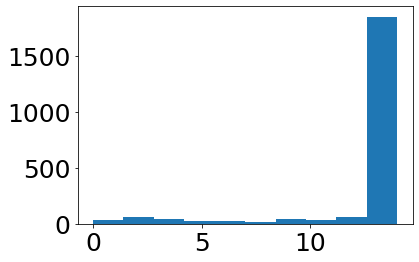

In [276]:
plt.hist(best_ages,range=(0,14))

In [300]:
vanden_age[np.where(gcs_clus=='M22')]

array([12.5])

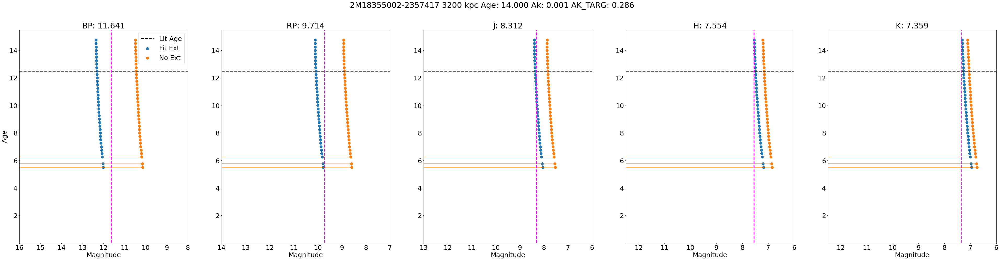

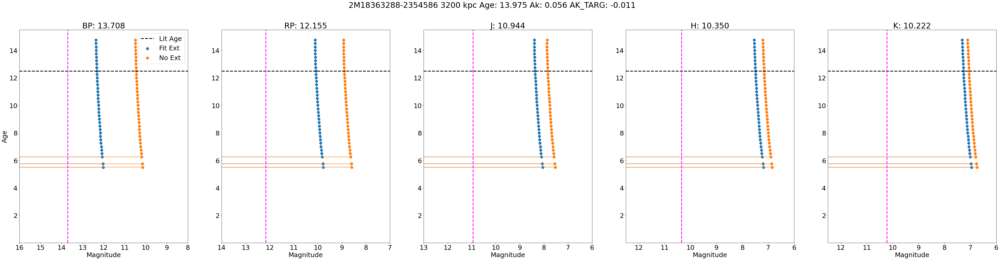

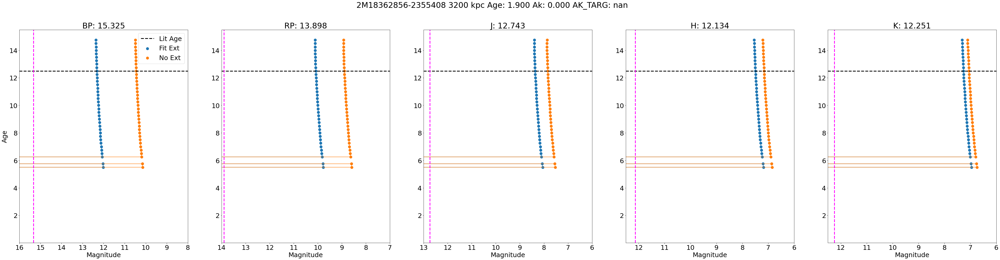

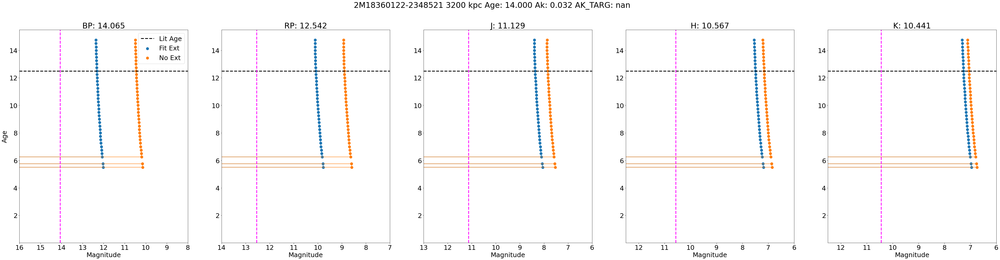

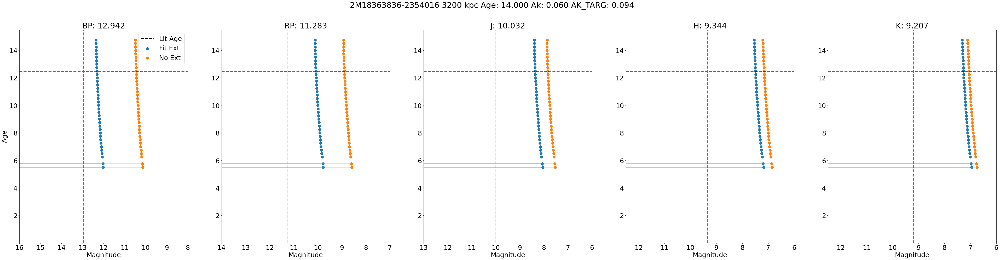

In [323]:
bands = ['BP','RP','J','H','K']
for j in range(len(globbads)):
    fig, ax = plt.subplots(1,5,figsize=[67,15])
    for i in range(5):
        ax[i].scatter(m22badtheos[:,0,i],np.arange(0,15,0.25),s=100,label='Fit Ext')
        ax[i].plot(m22badtheos[:,0,i],np.arange(0,15,0.25))
        ax[i].scatter(m22badtheos0[:,0,i],np.arange(0,15,0.25),s=100,label='No Ext')
        ax[i].plot(m22badtheos0[:,0,i],np.arange(0,15,0.25))
        ax[i].set_ylim(bottom=0.01)
        ax[i].axhline(12.5,c='k',ls='--',label='Lit Age',lw=3.0)
        ax[i].set_xlabel(r'Magnitude')

    ax[0].axvline(gcsdr17[globbads[j]]['GAIAEDR3_PHOT_BP_MEAN_MAG'],ls='--',c='magenta',lw=3.0)
    ax[1].axvline(gcsdr17[globbads[j]]['GAIAEDR3_PHOT_RP_MEAN_MAG'],ls='--',c='magenta',lw=3.0)
    ax[2].axvline(gcsdr17[globbads[j]]['J'],ls='--',c='magenta',lw=3.0)
    ax[3].axvline(gcsdr17[globbads[j]]['H'],ls='--',c='magenta',lw=3.0)
    ax[4].axvline(gcsdr17[globbads[j]]['K'],ls='--',c='magenta',lw=3.0)

    ax[0].set_title(r'BP: {:.3f}'.format(gcsdr17[globbads[j]]['GAIAEDR3_PHOT_BP_MEAN_MAG']))
    ax[1].set_title(r'RP: {:.3f}'.format(gcsdr17[globbads[j]]['GAIAEDR3_PHOT_RP_MEAN_MAG']))
    ax[2].set_title(r'J: {:.3f}'.format(gcsdr17[globbads[j]]['J']))
    ax[3].set_title(r'H: {:.3f}'.format(gcsdr17[globbads[j]]['H']))
    ax[4].set_title(r'K: {:.3f}'.format(gcsdr17[globbads[j]]['K']))

    ax[0].set_xlim(16.,8.)
    ax[1].set_xlim(14.,7.)
    ax[2].set_xlim(13.,6.)
    ax[3].set_xlim(12.5,6.)
    ax[4].set_xlim(12.5,6.)
    
#     if j == 2:
#         ax[0].set_xlim(12.75,7.5)
#         ax[1].set_xlim(12.5,7.)
#         ax[2].set_xlim(12.5,6.75)
        
#     if j == 4:
#         ax[0].set_xlim(10.7,7.5)
#         ax[1].set_xlim(10.5,7.)
#         ax[2].set_xlim(10.,6.75)

    ax[0].legend()

    ax[0].set_ylabel('Age')
    plt.suptitle(r'{} 3200 kpc Age: {:.3f} Ak: {:.3f} AK_TARG: {:.3f}'.format(gcsdr17[globbads[j]]['APOGEE_ID'],
                                                                              best_ages[j],best_aks[j],
                                                                              gcsdr17[globbads[j]]['AK_TARG']))

#     plt.savefig('{}AgeMagDiag.pdf'.format(gcsdr17[globbads[j]]['APOGEE_ID']),bbox_inches='tight')
    plt.show()

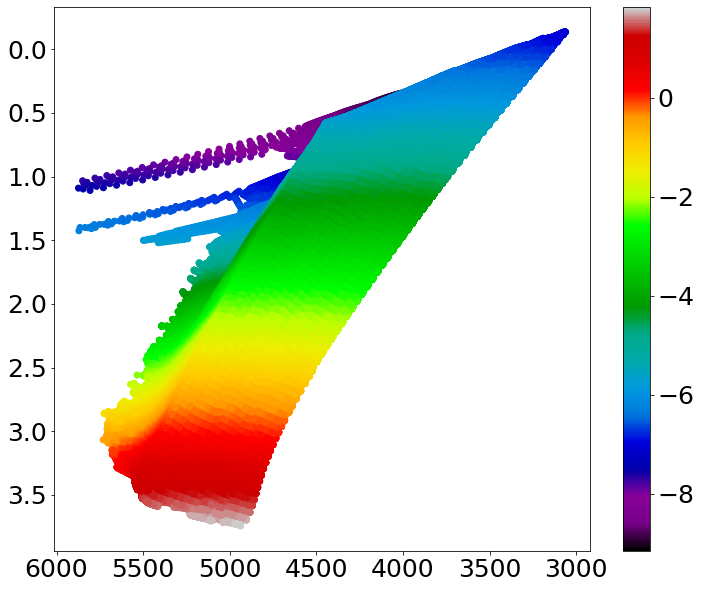

In [236]:
test = np.where(10**massive['logTe']<max(gcsdr17['TEFF']))
plt.figure(figsize=[12,10])
plt.scatter(10**massive['logTe'][test],massive['logg'][test],c=massive['Ksmag'][test],cmap='nipy_spectral')
plt.colorbar()
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()
plt.show()

In [232]:
max(gcsdr17['TEFF'])

5881.8555

In [234]:
np.where(10**massive['logTe']>max(gcsdr17['TEFF']))

(array([  43,   44,   45,   46,   47,   48,   49,   63,   74,   77,   78,
          79,   80,   81,  193,  194,  208,  209,  243,  249,  250,  254,
         255,  322,  323,  324,  325,  326,  327,  328,  330,  366,  367,
         368,  369,  370,  371,  378,  450,  451,  452,  490,  491,  509,
         588,  589,  590,  591,  592,  593,  596,  617,  618,  619,  620,
         635,  636,  637,  638,  643,  660,  661,  662,  663,  679,  680,
         681,  732,  733,  734,  735,  792,  793,  794,  795,  840,  841,
         842,  844,  845,  846,  847,  853,  854,  855,  856,  859,  860,
         881,  882,  883,  884,  885,  890,  913,  914,  915,  916,  917,
         918,  919,  920,  935,  936,  937,  938,  940,  941,  942,  946,
         947,  948,  949,  950,  951,  952,  953,  959,  964,  965,  972,
         983,  984,  985,  999, 1000, 1001, 1002, 1007, 1008, 1009, 1010,
        1011, 1012, 1013, 1014, 1015, 1016, 1017, 1025, 1027, 1028, 1034,
        1035, 1036, 1037, 1038, 1039, 

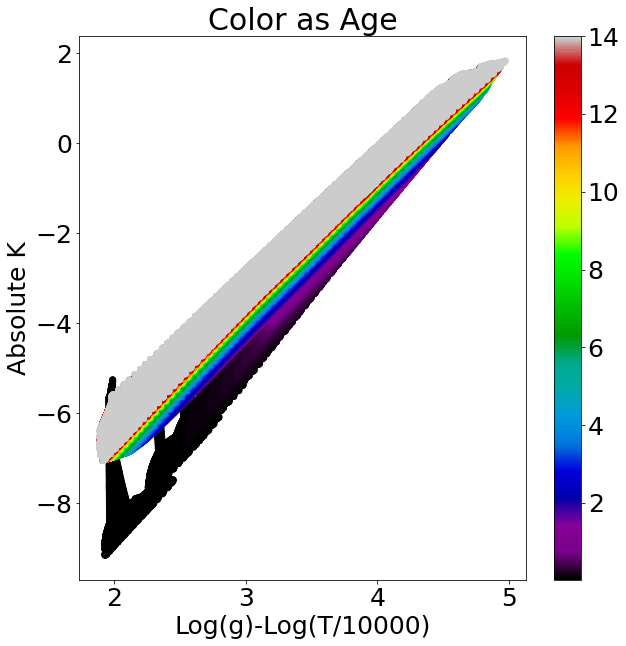

In [290]:
plt.figure(figsize=[10,10])
plt.scatter(massive['logg']-4*np.log10(10**massive['logTe']/10**4),massive['Ksmag'],
            c=10**massive['logAge']/10**9,cmap='nipy_spectral')
plt.colorbar()
plt.title(r'Color as Age')
plt.xlabel(r'Log(g)-Log(T/10000)')
plt.ylabel(r'Absolute K')
plt.show()

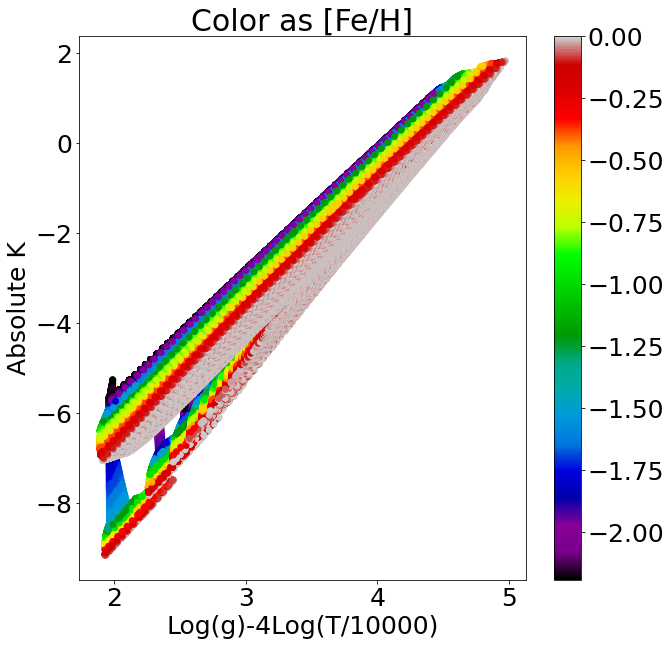

In [306]:
plt.figure(figsize=[10,10])
plt.scatter(massive['logg']-4*np.log10(10**massive['logTe']/10**4),massive['Ksmag'],
            c=massive['MH'],cmap='nipy_spectral')
plt.colorbar()
plt.title(r'Color as [Fe/H]')
plt.xlabel(r'Log(g)-4Log(T/10000)')
plt.ylabel(r'Absolute K')
plt.show()

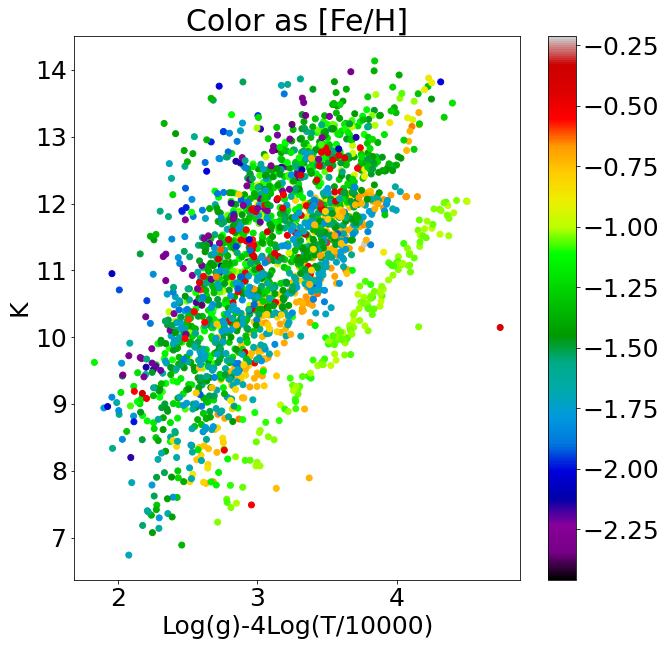

In [305]:
plt.figure(figsize=[10,10])
plt.scatter((gcsdr17['LOGG']-4*np.log10(gcsdr17['TEFF']/10**4)),gcsdr17['K'],
            c=gcsdr17['FE_H'],cmap='nipy_spectral')
plt.colorbar()
plt.title(r'Color as [Fe/H]')
plt.xlabel(r'Log(g)-4Log(T/10000)')
plt.ylabel(r'K')
plt.show()

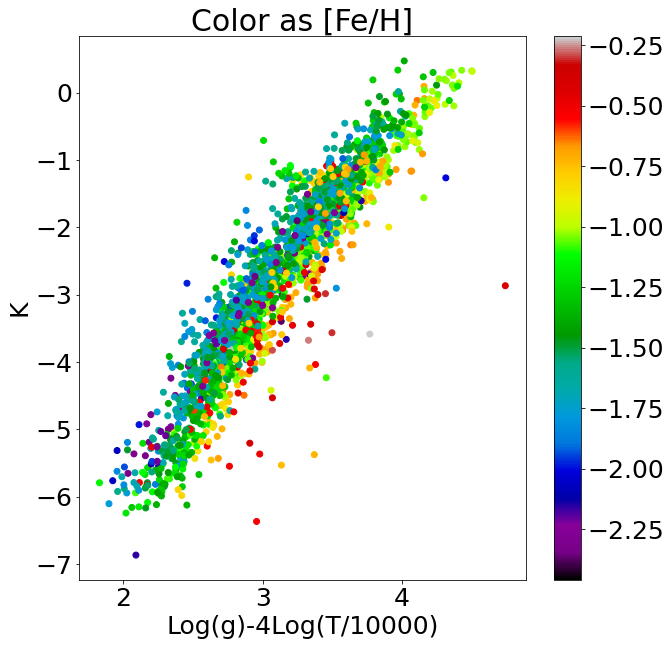

In [303]:
plt.figure(figsize=[10,10])
plt.scatter((gcsdr17['LOGG']-4*np.log10(gcsdr17['TEFF']/10**4)),gcsdr17['K']-5.0*np.log10(gcs_dist)+5.0,
            c=gcsdr17['FE_H'],cmap='nipy_spectral')
plt.colorbar()
plt.title(r'Color as [Fe/H]')
plt.xlabel(r'Log(g)-4Log(T/10000)')
plt.ylabel(r'K')
plt.show()

In [ ]:
# maybe try teff weighted logg and [Fe/H] to get absolute K

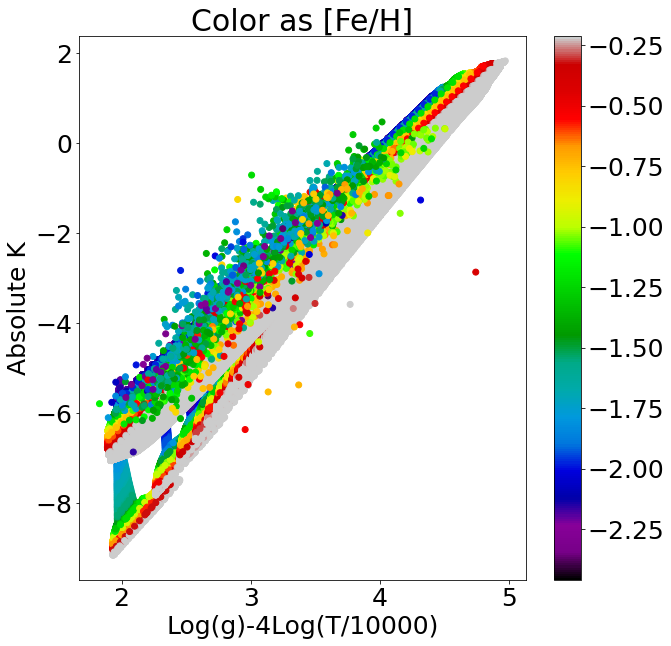

In [304]:
plt.figure(figsize=[10,10])
plt.scatter(massive['logg']-4*np.log10(10**massive['logTe']/10**4),massive['Ksmag'],
            c=massive['MH'],cmap='nipy_spectral',vmax=max(gcsdr17['FE_H']),vmin=min(gcsdr17['FE_H']))
plt.scatter((gcsdr17['LOGG']-4*np.log10(gcsdr17['TEFF']/10**4)),gcsdr17['K']-5.0*np.log10(gcs_dist)+5.0,
            c=gcsdr17['FE_H'],cmap='nipy_spectral')
plt.colorbar()
plt.title(r'Color as [Fe/H]')
plt.xlabel(r'Log(g)-4Log(T/10000)')
plt.ylabel(r'Absolute K')
plt.show()